In [1]:
import os
import sys
import random
import time
from random import seed, randint
import argparse
import platform
from datetime import datetime
import imp
import numpy as np
import fileinput
from itertools import product
import pandas as pd
from scipy.interpolate import griddata
from scipy.interpolate import interp2d
import seaborn as sns
from os import listdir

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import griddata
import matplotlib as mpl
# sys.path.insert(0,'..')
# from notebookFunctions import *
# from .. import notebookFunctions
from Bio.PDB.Polypeptide import one_to_three
from Bio.PDB.Polypeptide import three_to_one
from Bio.PDB.PDBParser import PDBParser
from pyCodeLib import *
from small_script.myFunctions import *
from collections import defaultdict
%matplotlib inline
# plt.rcParams['figure.figsize'] = (10,6.180)    #golden ratio
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = np.array([16.18033, 10])    #golden ratio
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})

In [3]:
pdb_list = ["1akr", "1opd", "1ptf", "1tig", "1tmy", "2acy", "5nul"]

In [100]:

simulationType = "evaluation_simulation"
run_n = 5
# folder_list = ["iteration_14_frag_zBias_2", "iteration_14_contact_stronger_frag_zBias_2", "iteration_13_frag_zBias_2", "iteration_12_frag_zBias_2", "run2_frag_cbd_shift_center_iter10_include_native", "run2_frag_cbd_shift_center_iter4", "run2_frag_old", "run2_frag_cbd", "run2_frag_cbd_shift_center"]
folder_list = ["iteration_16_frag_zBias_3", "iteration_15_frag_zBias_2", "iteration_14_frag_zBias_2", "iteration_14_contact_stronger_frag_zBias_2", "iteration_12_frag_zBias_2", "run2_frag_old", "run2_frag_cbd", "run2_frag_cbd_shift_center"]

all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/jun_week1_2020/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder, location)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/evaluation_simulation_run2_frag_cbd_shift_center_06-03.csv


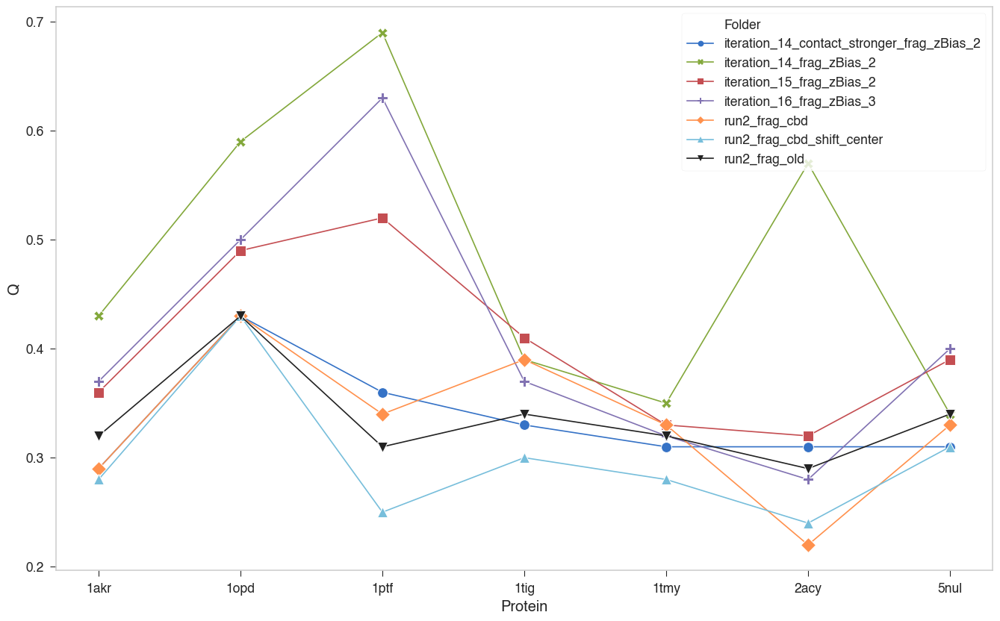

In [101]:
data = pd.read_csv("/Users/weilu/Research/data/openMM/evaluation_simulation_run2_frag_cbd_shift_center_06-03.csv")
data = data.query("Folder !='iteration_12_frag_zBias_2'").reset_index(drop=True)
y = "Q"
d = data.query("Steps > 1950").reset_index(drop=True)
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')
# plt.legend(["original model", "CBD model"])

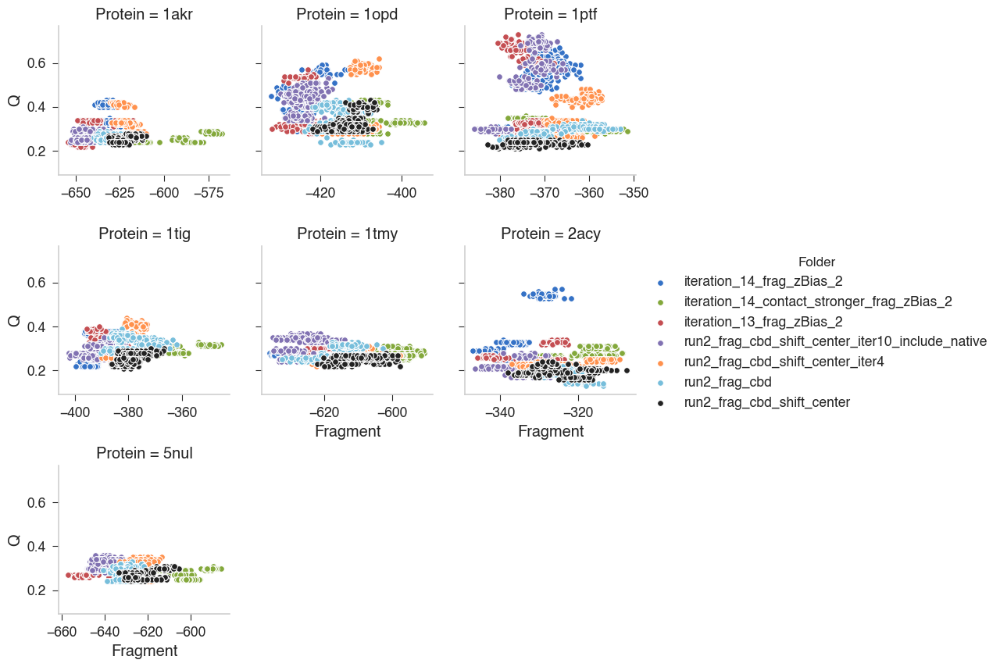

In [95]:
d50 = data.query("Steps > 1950 and Folder !='run2_frag_old'").reset_index(drop=True)
g = sns.FacetGrid(d50, col="Protein", hue="Folder", col_wrap=3, sharex=False)
g = g.map(sns.scatterplot, "Fragment", "Q").add_legend()
# plt.legend()

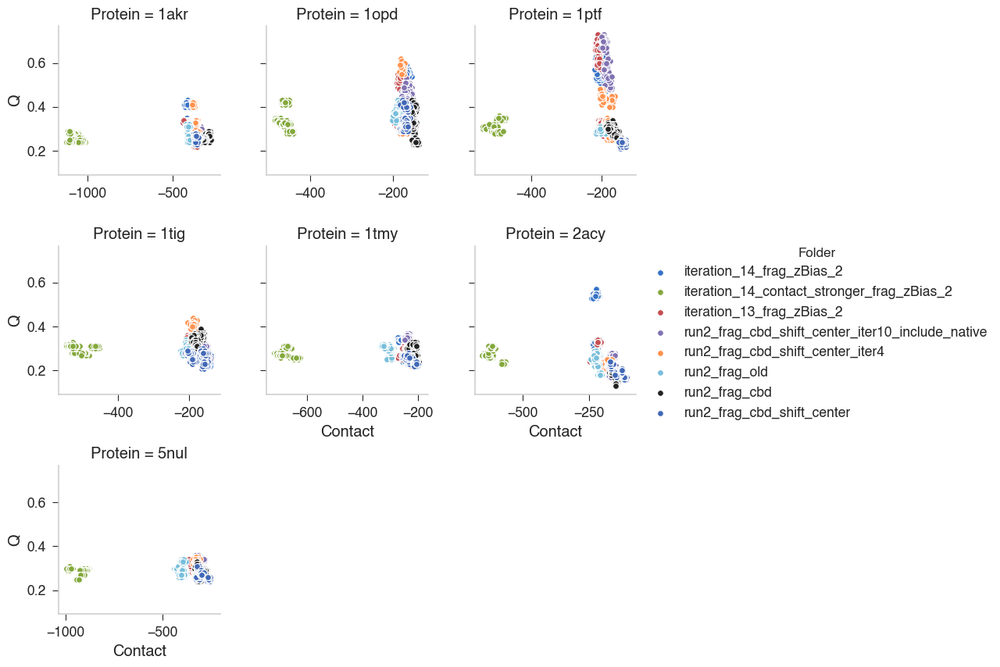

In [96]:
d50 = data.query("Steps > 1950").reset_index(drop=True)
g = sns.FacetGrid(d50, col="Protein", hue="Folder", col_wrap=3, sharex=False)
g = g.map(sns.scatterplot, "Contact", "Q").add_legend()
# plt.legend()

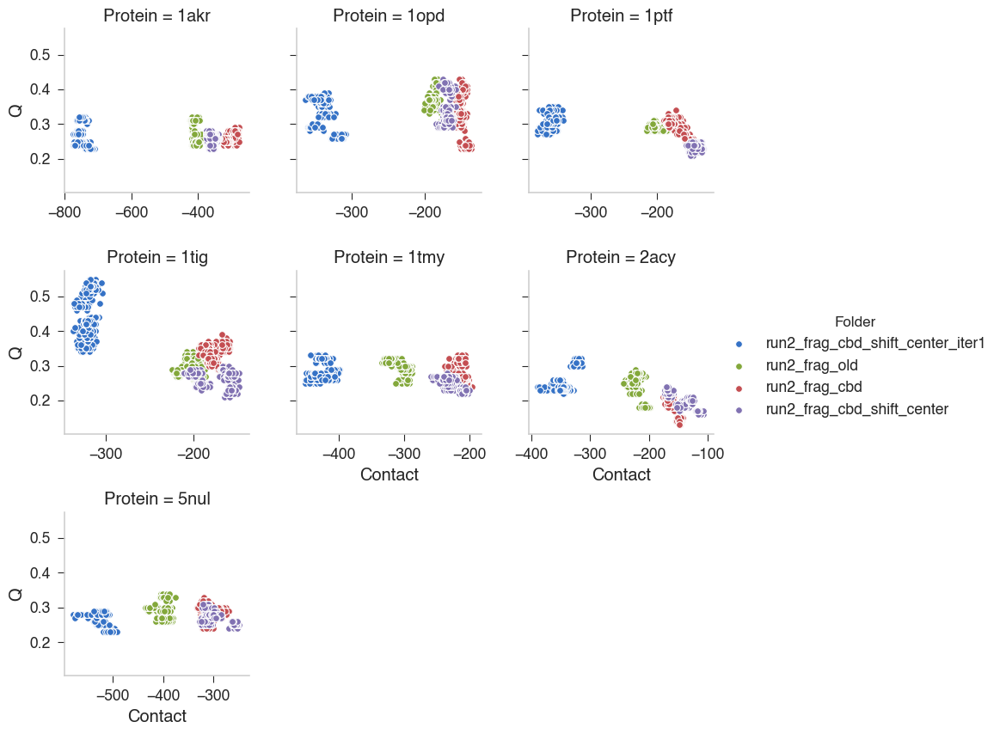

In [32]:
d50 = data.query("Steps > 1950").reset_index(drop=True)
g = sns.FacetGrid(d50, col="Protein", hue="Folder", col_wrap=3, sharex=False)
g = g.map(sns.scatterplot, "Contact", "Q").add_legend()
# plt.legend()

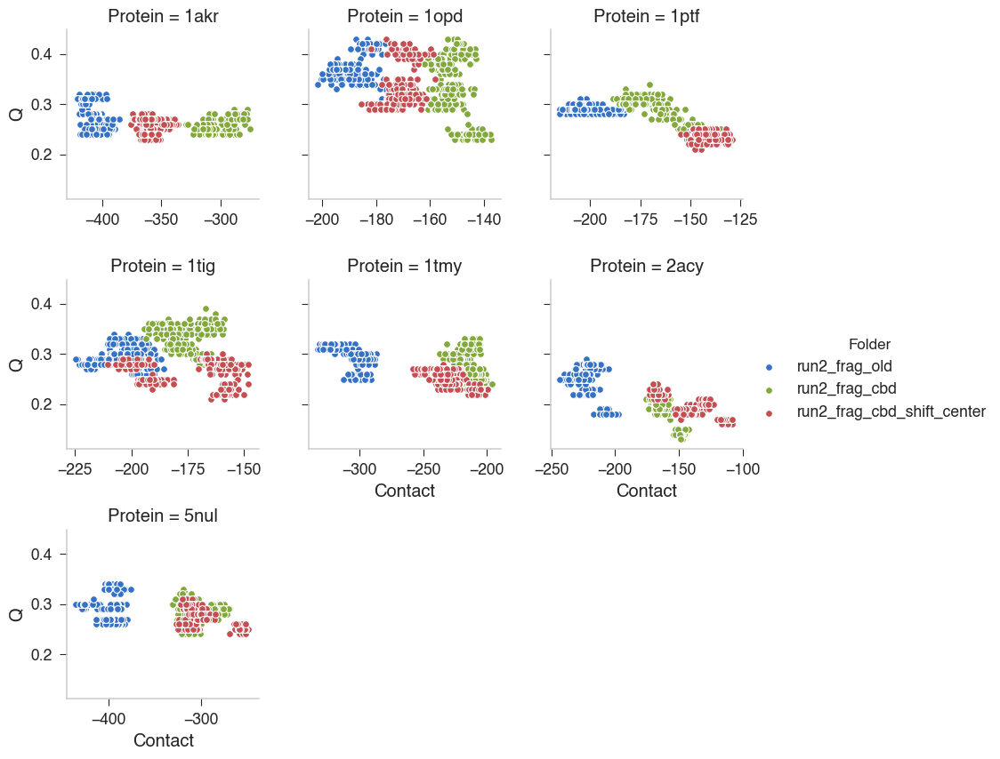

In [27]:
d50 = data.query("Steps > 1950").reset_index(drop=True)
g = sns.FacetGrid(d50, col="Protein", hue="Folder", col_wrap=3, sharex=False)
g = g.map(sns.scatterplot, "Contact", "Q").add_legend()
# plt.legend()

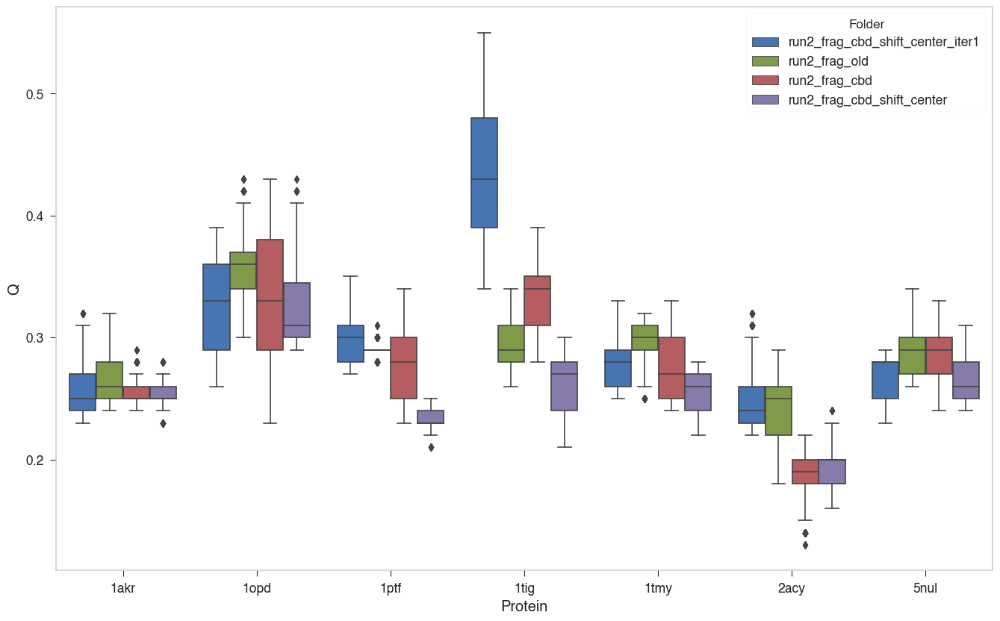

In [33]:
sns.boxplot("Protein", "Q", hue="Folder", data=d50)

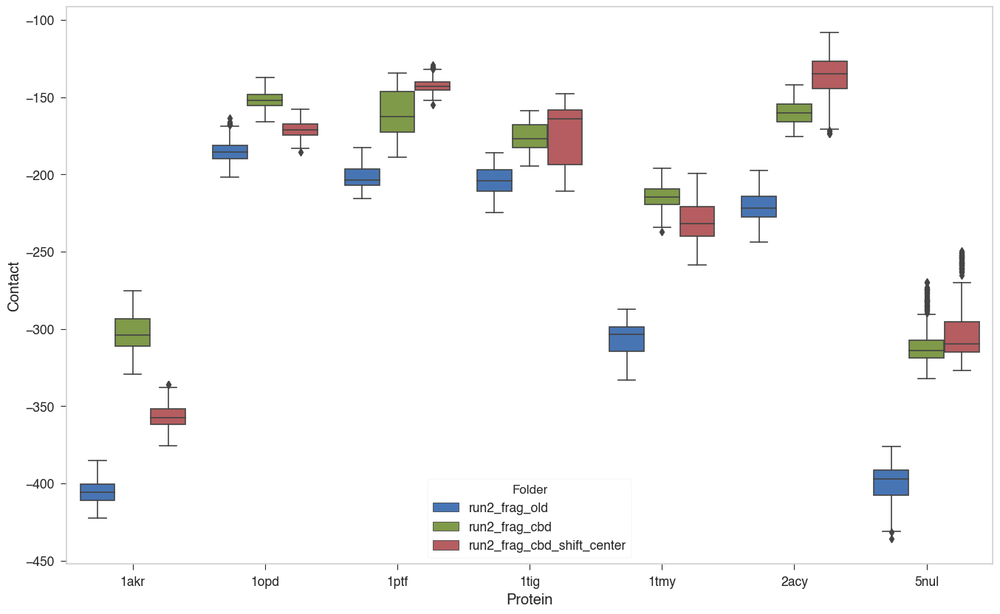

In [19]:
sns.boxplot("Protein", "Contact", hue="Folder", data=d50)

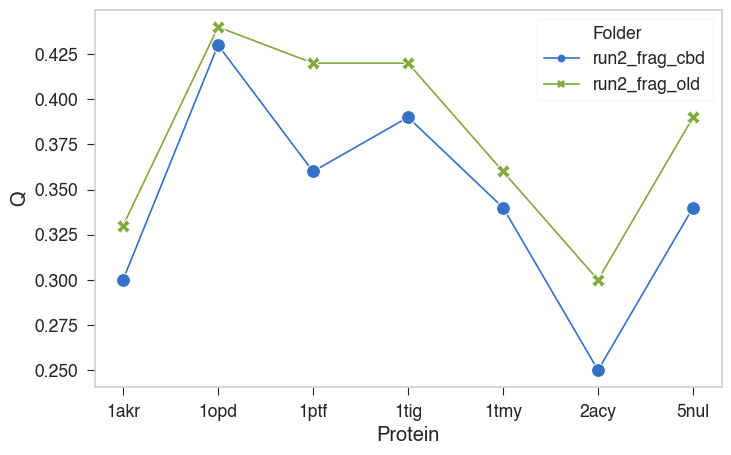

In [71]:
max_Q_data = d.sort_values("Q").groupby(["Protein", "Folder"]).tail(1).reset_index(drop=True)
sub_data = max_Q_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)

In [58]:
sub_data

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Excl_CBD,S_chain,Excl,Beta,Pap,Helical,Total,Run,Protein,Folder
0,1827,0.30,14.64,233.69,-650.88,-278.81,-636.67,16.95,-93.68,11.05,-53.86,-10.92,0.0,-1480.08,3,1akr,run2_frag_cbd
1,1528,0.33,12.62,349.66,-631.22,-368.64,-674.57,0.00,0.00,0.00,-48.10,-13.38,0.0,-1386.26,3,1akr,run2_frag_old
2,1953,0.43,12.49,111.72,-490.00,-151.05,-416.22,8.75,-72.87,3.92,-33.22,-5.76,0.0,-1053.49,1,1opd,run2_frag_cbd
3,1614,0.44,11.07,176.24,-476.76,-177.40,-454.94,0.00,0.00,0.00,-31.86,-6.13,0.0,-970.86,1,1opd,run2_frag_old
4,1428,0.36,12.79,181.70,-463.18,-151.86,-355.18,4.44,-8.69,8.40,-14.63,-1.19,0.0,-804.62,0,1ptf,run2_frag_cbd
5,1104,0.42,11.20,256.92,-453.98,-189.70,-389.06,0.00,0.00,0.00,-26.73,-6.02,0.0,-808.57,1,1ptf,run2_frag_old
6,1669,0.39,13.15,137.88,-418.86,-157.33,-376.44,12.15,-20.78,7.56,-34.13,-4.44,0.0,-866.54,2,1tig,run2_frag_cbd
7,1518,0.42,11.91,219.50,-415.01,-186.56,-421.94,0.00,0.00,0.00,-26.81,-7.20,0.0,-838.02,1,1tig,run2_frag_old
8,1867,0.34,15.14,163.82,-784.28,-208.02,-613.41,8.11,-79.73,8.26,-44.65,-3.92,0.0,-1561.92,3,1tmy,run2_frag_cbd
9,1147,0.36,12.40,353.75,-745.20,-256.54,-660.83,0.00,0.00,0.00,-29.46,-8.20,0.0,-1346.49,1,1tmy,run2_frag_old


In [28]:

simulationType = "evaluation_simulation"
run_n = 3
folder_list = ["run1_cbd_withBeta_stronger_side_chain_new_exclude", "run1_cbd_withBeta_stronger_side_chain", "run1", "run1_cbd_withBeta"]
all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/may_week1_2020//{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder, location)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/evaluation_simulation_run1_cbd_withBeta_05-04.csv


In [33]:
plt.rcParams['figure.figsize'] = 0.5 * np.array([16.18033, 10])    #golden ratio

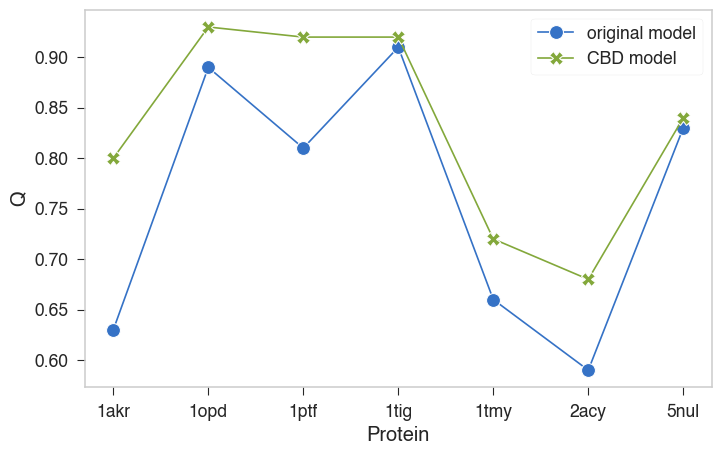

In [63]:
data = pd.read_csv("/Users/weilu/Research/data/openMM/evaluation_simulation_run1_cbd_withBeta_05-04.csv")
data = data.reset_index(drop=True)
y = "Q"
d = data.query("Steps > 1000").reset_index(drop=True)
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data.query("Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')
plt.legend(["original model", "CBD model"])

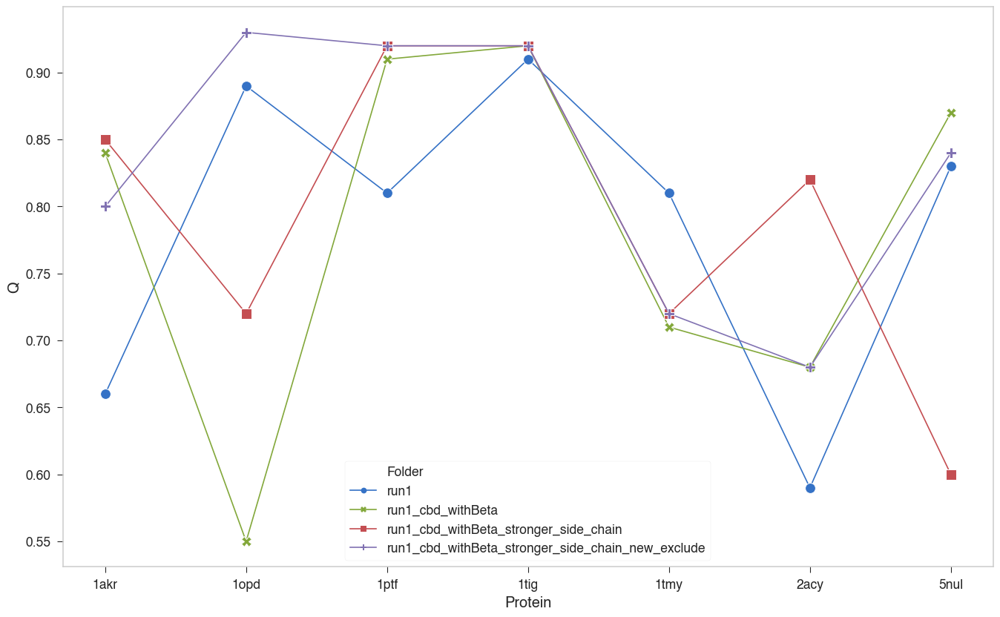

In [30]:
y = "Q"
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [36]:
data["Folder_Run"]=  data["Folder"] + data["Run"].astype(str)

In [39]:
plt.rcParams['figure.figsize'] = np.array([16.18033, 10])    #golden ratio

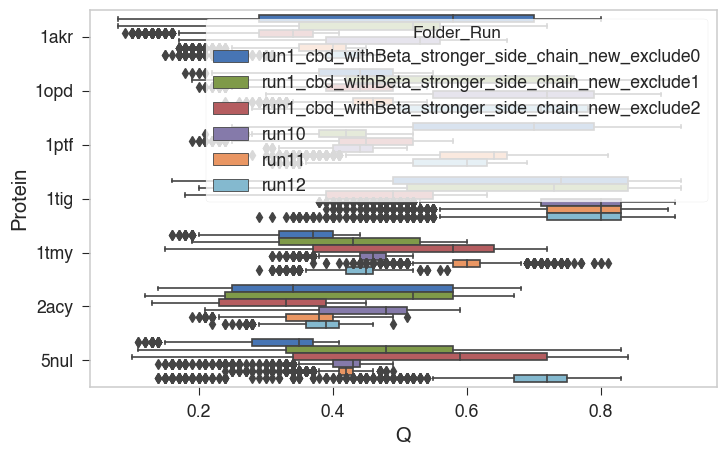

In [50]:
chosen = data.query("Steps > 100 and Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
sns.boxplot("Q", "Protein", data=chosen, hue="Folder_Run")

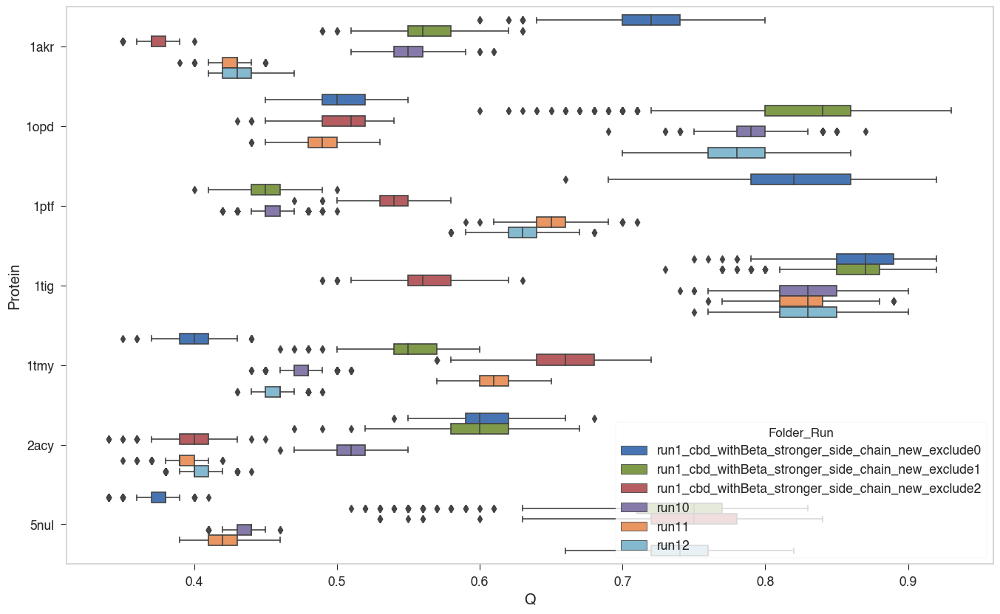

In [42]:
chosen = data.query("Steps > 1500 and Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
sns.boxplot("Q", "Protein", data=chosen, hue="Folder_Run")

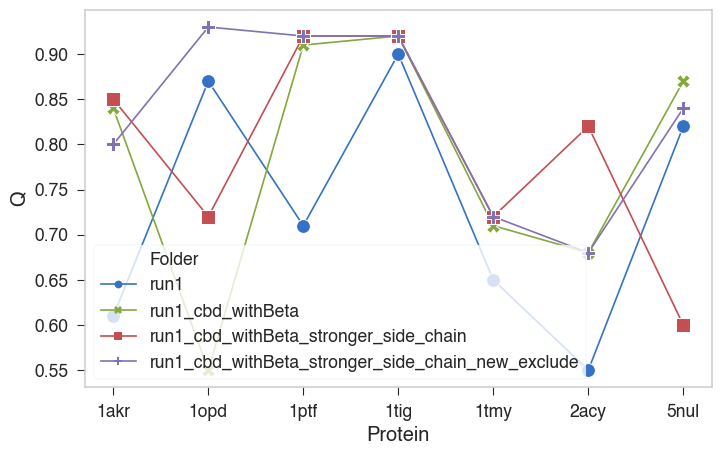

In [53]:
plt.rcParams['figure.figsize'] = 0.5 * np.array([16.18033, 10])    #golden ratio
# chosen = data.query("Steps > 100 and Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
chosen = data.query("Steps > 1500")
max_Q_data = chosen.sort_values("Q").groupby(["Folder", "Protein"]).tail(1)
# sub_data = max_Q_data.query("Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
sub_data = max_Q_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')
# plt.legend(["original model", "CBD model"])


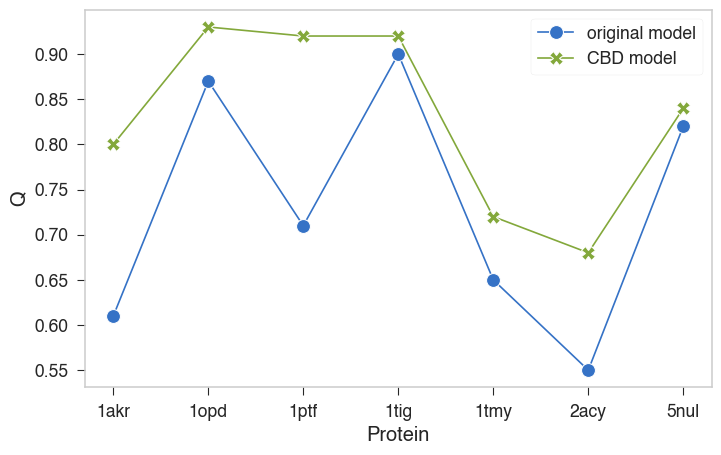

In [49]:
plt.rcParams['figure.figsize'] = 0.5 * np.array([16.18033, 10])    #golden ratio
max_Q_data = chosen.sort_values("Q").groupby(["Folder", "Protein"]).tail(1)
sub_data = max_Q_data.query("Folder != 'run1_cbd_withBeta' and Folder !='run1_cbd_withBeta_stronger_side_chain'")
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')
plt.legend(["original model", "CBD model"])


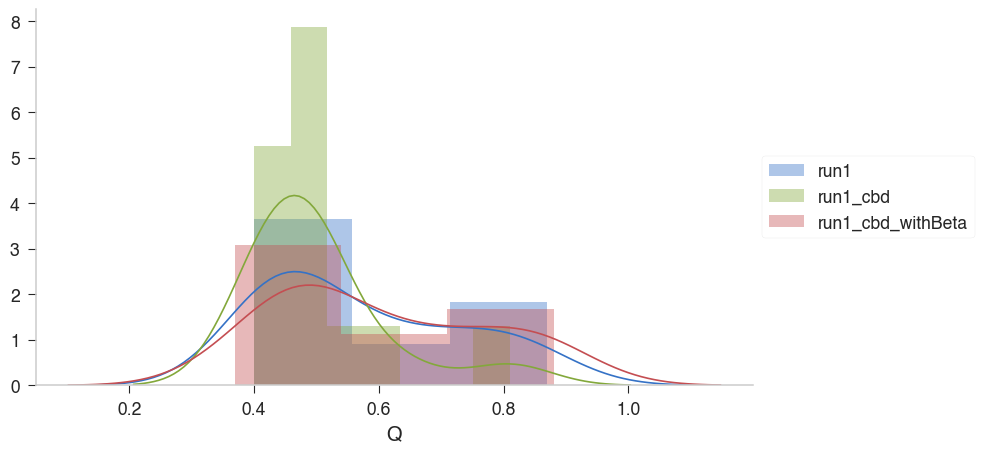

In [10]:
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_0_02-07.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_1_02-10.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteratiteration_native_new_4ion_2_02-11.csv", index_col=0)
data = pd.read_csv("/Users/weilu/Research/data/openMM/evaluation_simulation_run1_cbd_withBeta_05-03.csv", index_col=0)

sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)

y = "Steps"
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data


# sub_data = max_Q_data.query("Folder != 'iter3_environment'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [83]:
sub_data

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
0,2001,0.41,11.13,117.34,-196.05,-136.96,-251.59,0.0,0.0,0.0,-44.55,-17.16,0.0,-528.97,0,1hoe,iteration_0
1,2001,0.51,11.45,110.67,-194.74,-138.87,-264.83,0.0,0.0,0.0,-43.93,-21.11,0.0,-552.82,1,1hoe,iteration_0
2,2001,0.53,10.86,99.05,-199.22,-175.27,-260.06,0.0,0.0,0.0,-55.93,-21.02,0.0,-612.47,0,1hoe,iteration_1
3,2001,0.57,10.61,105.64,-196.98,-167.91,-266.47,0.0,0.0,0.0,-53.26,-18.12,0.0,-597.11,1,1hoe,iteration_1
4,2001,0.54,12.86,111.86,-428.93,-135.75,-279.88,0.0,0.0,0.0,-31.11,-4.79,0.0,-768.60,0,1tif,iteration_0
5,2001,0.57,12.62,107.60,-421.11,-127.06,-289.97,0.0,0.0,0.0,-49.94,-10.05,0.0,-790.52,1,1tif,iteration_0
6,2001,0.39,13.21,125.35,-424.33,-136.42,-255.69,0.0,0.0,0.0,-45.63,-9.06,0.0,-745.79,0,1tif,iteration_1
7,2001,0.50,12.63,116.50,-420.64,-146.02,-264.65,0.0,0.0,0.0,-53.17,-11.99,0.0,-779.97,1,1tif,iteration_1
8,2001,0.41,10.26,104.34,-297.86,-190.62,-251.90,0.0,0.0,0.0,-45.95,-11.39,0.0,-693.38,0,1vcc,iteration_0
9,2001,0.56,11.01,119.05,-301.40,-154.40,-289.91,0.0,0.0,0.0,-49.57,-7.43,0.0,-683.66,1,1vcc,iteration_0


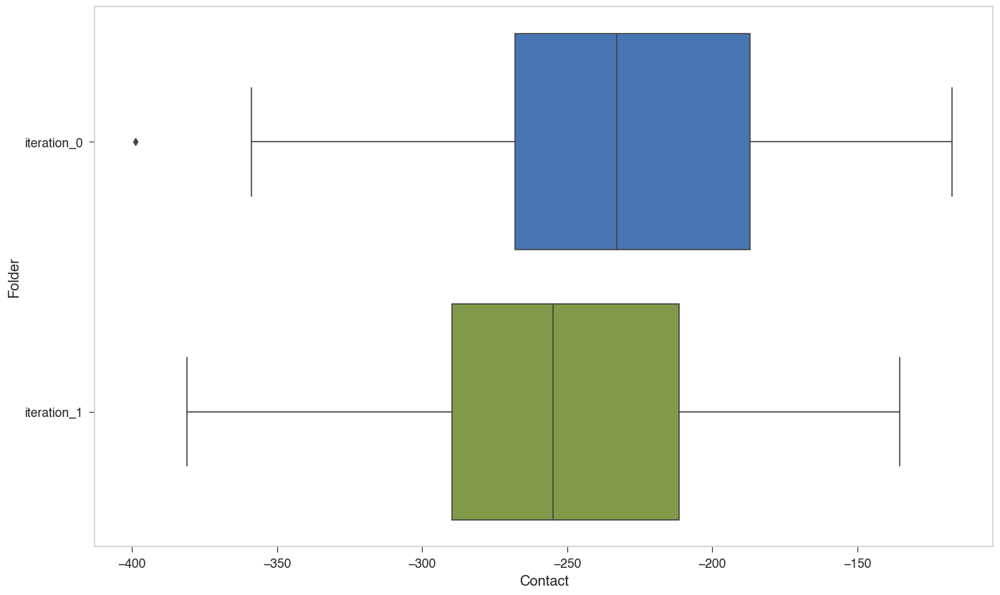

In [84]:
sns.boxplot("Contact", "Folder", data=sub_data)

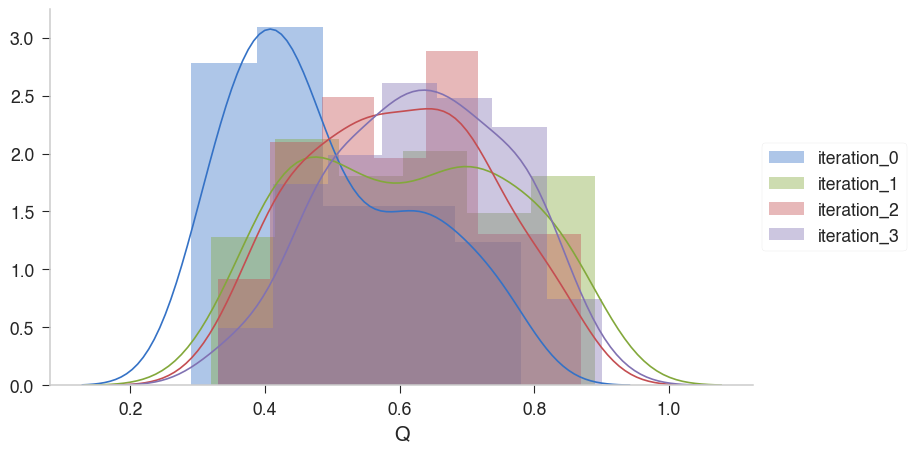

In [76]:

data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_3_02-17.csv", index_col=0)

# sub_pdb_list = pdb_list
# data.Protein = pd.Categorical(data.Protein, 
#                       categories=sub_pdb_list)

y = "Steps"
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data


# sub_data = max_Q_data.query("Folder != 'iter3_environment'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

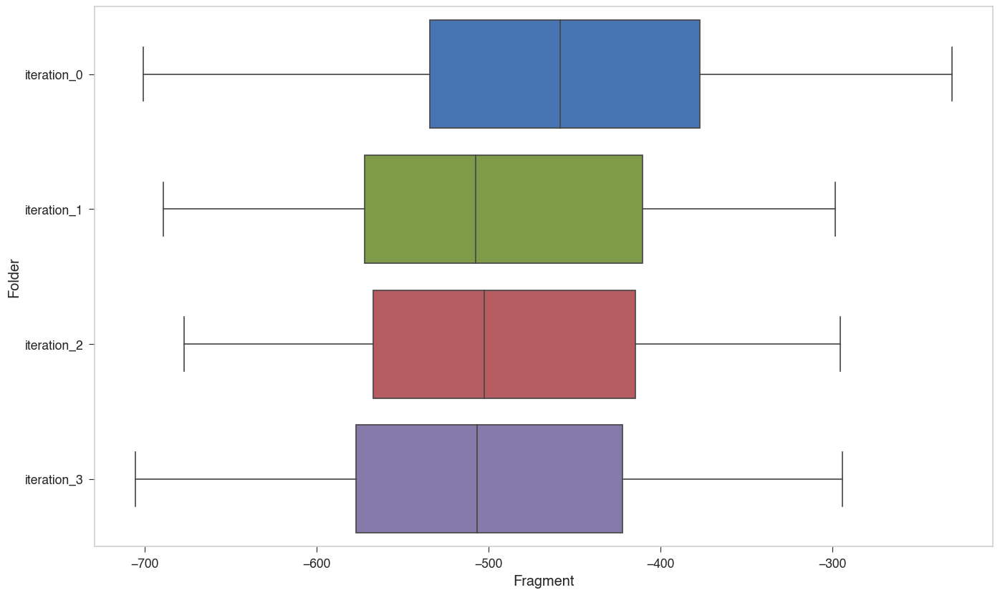

In [79]:
sns.boxplot("Fragment", "Folder", data=sub_data)

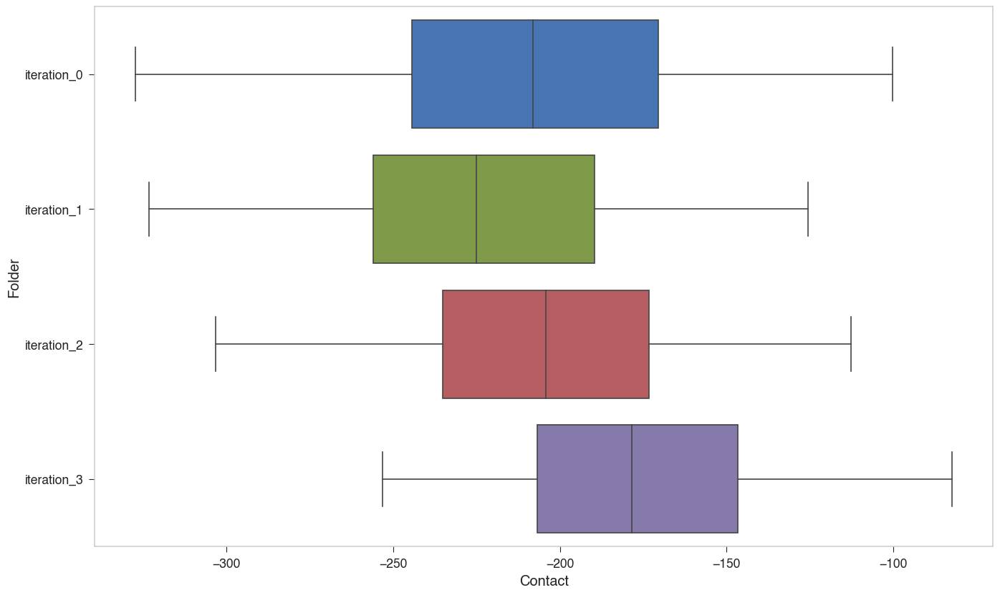

In [77]:
sns.boxplot("Contact", "Folder", data=sub_data)

In [401]:
raw_data_all = pd.read_csv("/Users/weilu/Research/frustration_selection/data.csv", index_col=0)

In [433]:
pre

'/Users/weilu/Research/server/mar_2020/mass_iterative_run/iter4_shift_well/1osa/1'

In [449]:
all_data = []
for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
            pre = f"/Users/weilu/Research/server/mar_2020/{simulationType}/{folder}/{pdb}/{i}"
            timeFile = f"{pre}/time.dat"
            time = float(np.loadtxt(timeFile))
            Length = len(read_fasta(f"{pre}/crystal_structure.fasta"))
            all_data.append([pdb, i, time, Length, folder])

In [450]:
data = pd.DataFrame(all_data, columns=["Protein", "Run", "Time", "Length", "Folder"])

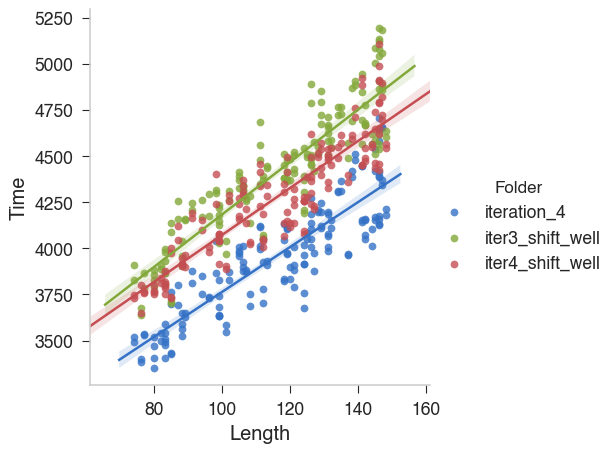

In [459]:
data_selected = data.query("Folder=='iter4_shift_well' or Folder=='iteration_4' or Folder=='iter3_shift_well'")
sns.lmplot("Length", "Time", hue="Folder", data=data_selected)

In [64]:

simulationType = "mass_iterative_run"
run_n = 2
folder_list = ["iteration_0_cbd", "iteration_1_cbd", "iteration_2_cbd", "iteration_start_native", "iteration_start_native_iter2"]
folder_list = ["iteration_0_cbd", "iteration_start_native", "iteration_start_native_iter2", 
               "iteration_start_native_iter3", "iteration_new_1", 
               "iteration_start_native_iter4", "iteration_start_native_iter5", "iteration_new_1"]
folder_list = ["iteration_0_cbd", "iteration_start_native", "iteration_new_1", 
               "iteration_start_native_iter4", "iteration_start_native_iter5", 
               "iteration_new_2", "iteration_new_3", "iteration_new_4", "iteration_native_new_4", "iteration_new_4_without_burial", "iteration_new_4_without_burial_shift_well"]
folder_list = ["iteration_0_cbd", "iteration_start_native",
               "iteration_new_4", "iteration_native_new_4", "iteration_new_4_without_burial", "iteration_new_4_without_burial_shift_well",
              "iteration_0_stronger_exclude_volume", "iteration_0_stronger_exclude_volume_k10"]
folder_list = ["iteration_0_cbd", "iteration_0_stronger_exclude_volume", "iteration_0_stronger_exclude_volume_k10",
              "iteration_1_stronger_exclude", "iteration_1_stronger_exclude_withoutBurial", "iteration_native_new_4",
              "iteration_2_stronger_exclude_withoutBurial", "iteration_1_stronger_exclude_withoutBurial_k10",
              "iteration_1_stronger_exclude_withoutBurial_bugfix"]
folder_list = ["iteration_0_cbd", "iteration_0_stronger_exclude_volume", "iteration_1_stronger_exclude_withoutBurial",
#               "iteration_2_stronger_exclude_withoutBurial", 
              "iteration_1_stronger_exclude_withoutBurial_bugfix", "iteration_0_stronger_exclude_volume_shift_well",
              "iteration_0_stronger_exclude_volume_stronger_side_chain", "iteration_0_stronger_exclude_volume_stronger_side_chain_k4",
              "iteration_2_bug_fixed"]
folder_list = ["iteration_3", "iteration_2_bug_fixed", "iteration_0_stronger_exclude_volume", "iteration_4", "iteration_4_z_weighted_2",
              "iter3_shift_well", "iter4_shift_well", "iter5_shift_well"]
folder_list = ["iter1_environment", "iter1_environment", "iteration_0_stronger_exclude_volume", "iteration_4_z_weighted_2",
              "iter3_shift_well", "iter4_shift_well", "iter5_shift_well", "iter0_environment"]
folder_list = ["iter4_environment", "iter3_environment", "iter2_environment", "iter1_environment", "iteration_4_z_weighted_2",
              "iter5_shift_well", "iter0_environment"]
folder_list = ["iteration_4_z_weighted_2", "new_iter1_environment_new", "new_iter2_environment_new", "new_iter3_environment_new", "new_iter4_environment_new", "new_iter5_environment_new"]
all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/apr_2020/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/mass_iterative_run_new_iter5_environment_new_05-01.csv


In [69]:
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_0_02-07.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_1_02-10.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteratiteration_native_new_4ion_2_02-11.csv", index_col=0)
data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_new_iter5_environment_new_05-01.csv", index_col=0)

sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)



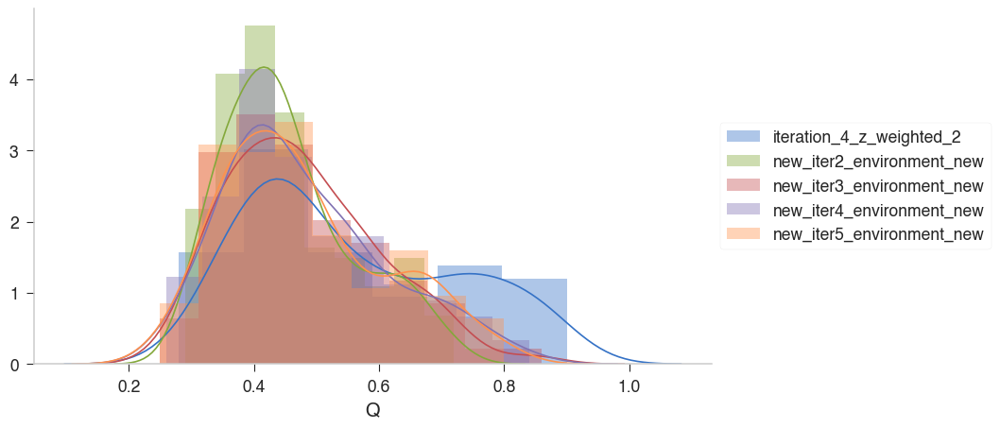

In [70]:
y = "Steps"
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data.query("Folder !='new_iter1_environment_new'")


# sub_data = max_Q_data.query("Folder != 'iter3_environment'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [66]:
y = "Steps"
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data

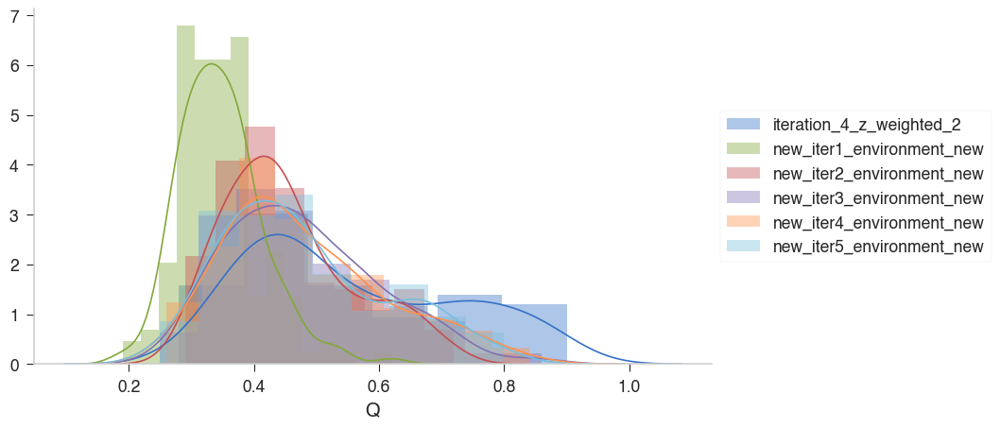

In [67]:

# sub_data = max_Q_data.query("Folder != 'iter3_environment'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

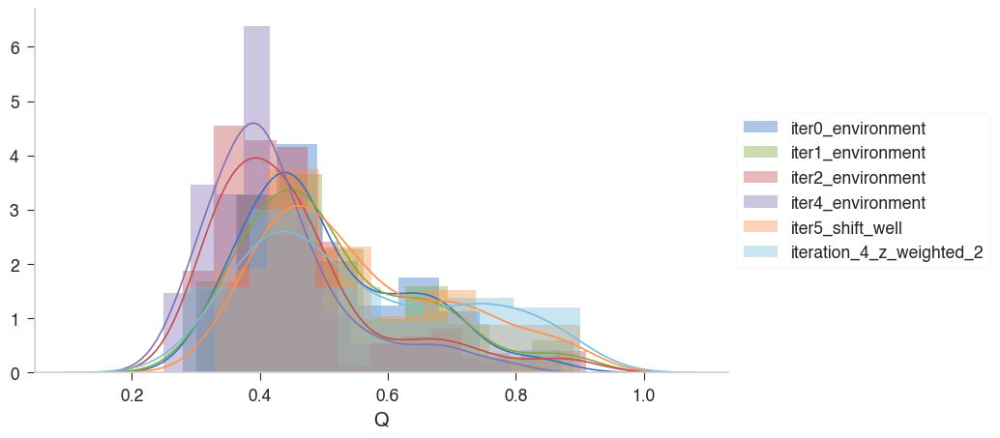

In [30]:

sub_data = max_Q_data.query("Folder != 'iter3_environment'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

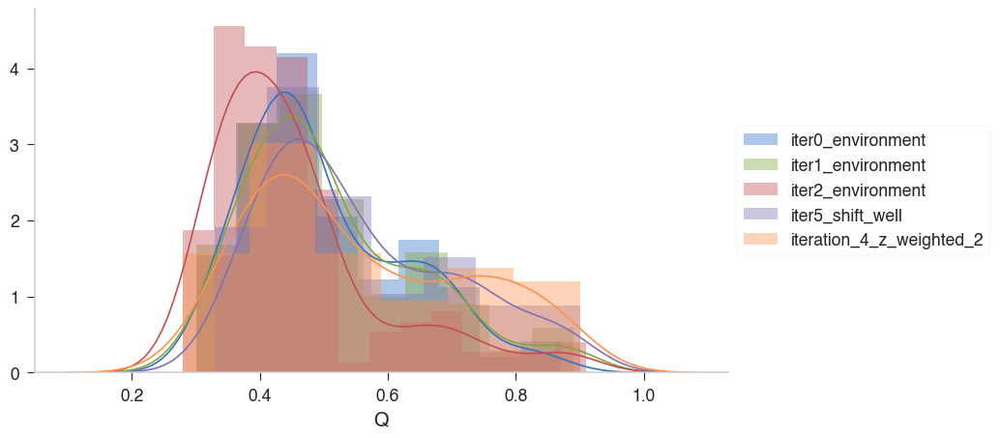

In [18]:


g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

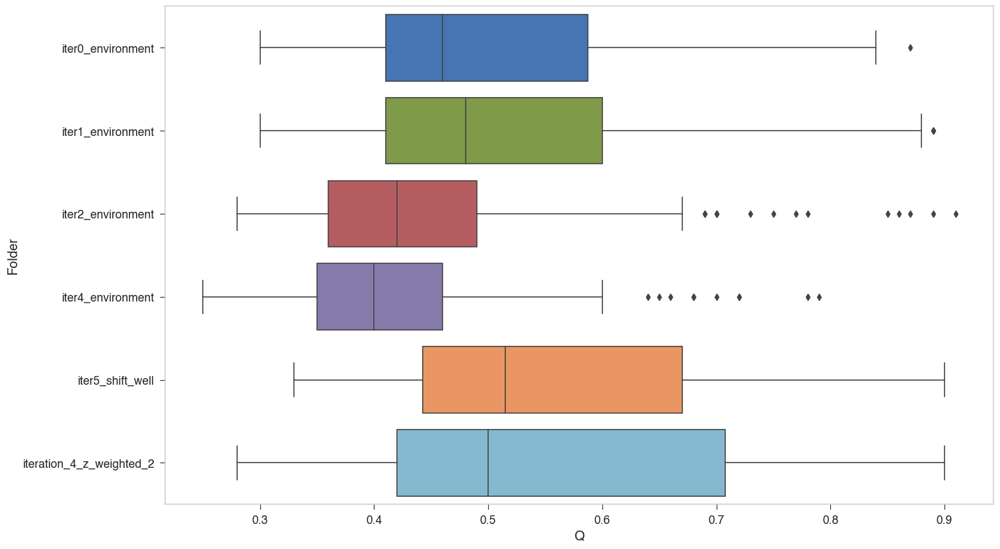

In [31]:
sns.boxplot("Q", "Folder", data=sub_data)

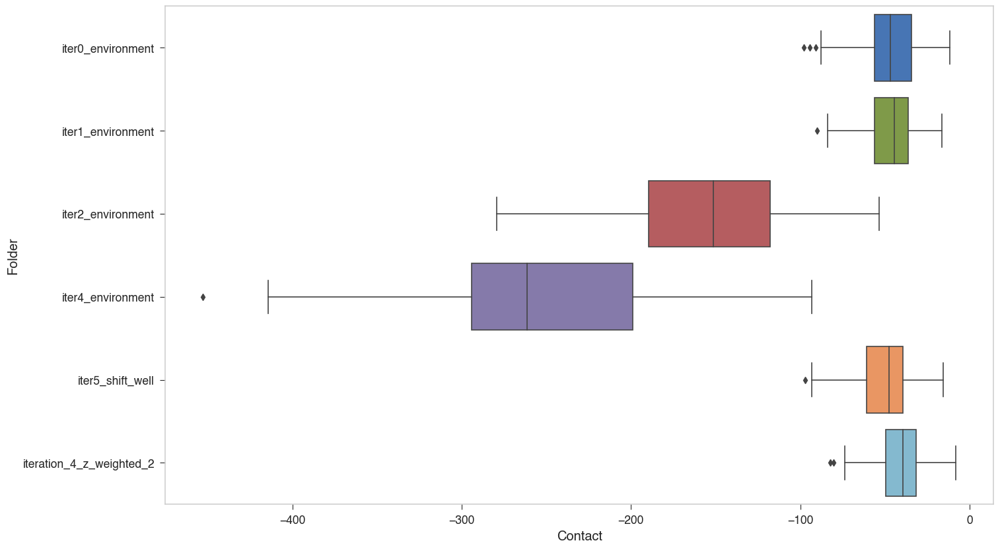

In [32]:
sns.boxplot("Contact", "Folder", data=sub_data)

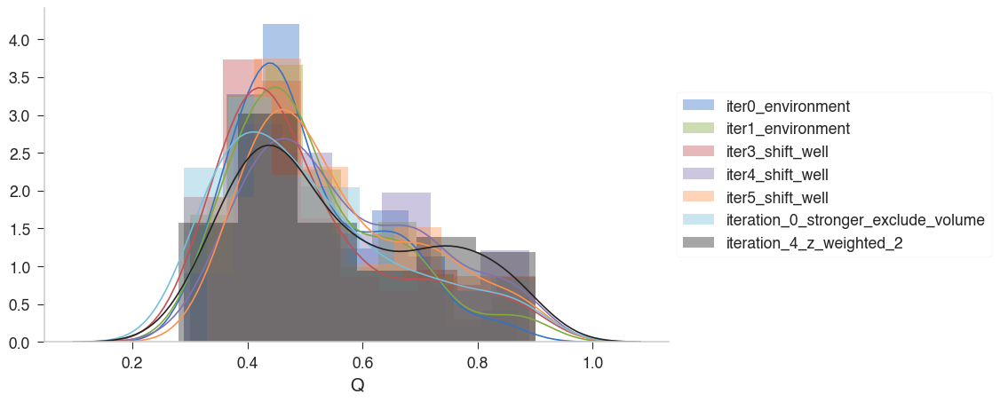

In [14]:


g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

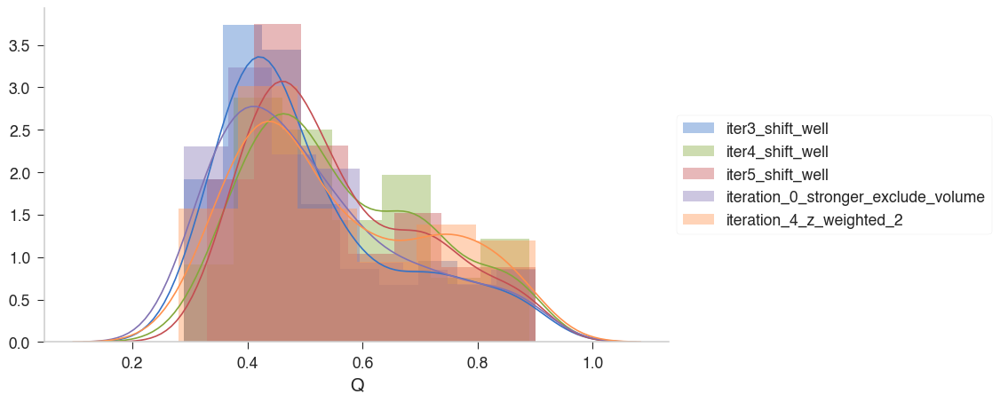

In [474]:


g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

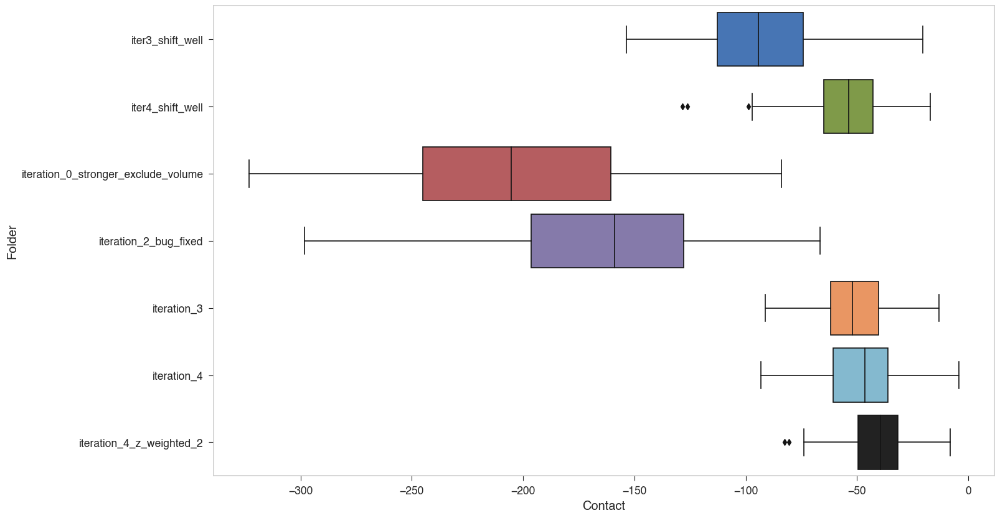

In [432]:
sns.boxplot("Contact", "Folder", data=sub_data)

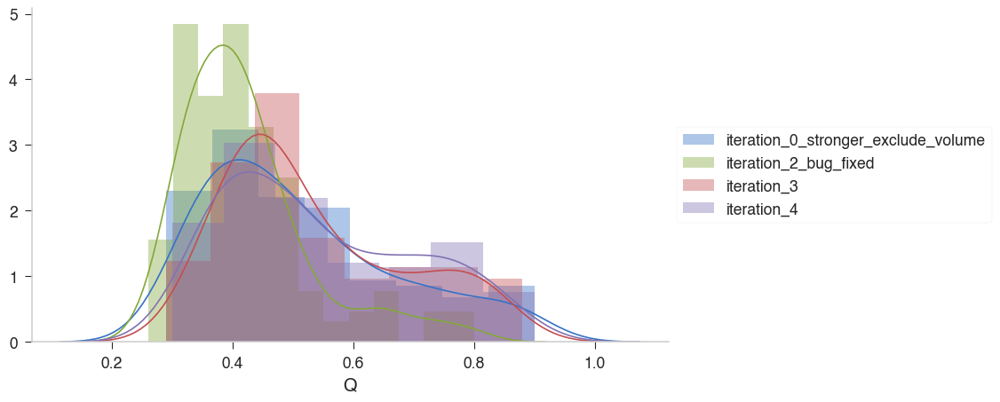

In [393]:


g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [396]:
sub_data.query("Folder=='iteration_4'").sort_values("Contact")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
583,2001,0.61,15.47,164.30,-652.76,-93.28,-609.14,19.65,32.63,6.05,-133.58,-37.42,0.0,-1303.55,1,1aly,iteration_4
390,2001,0.54,15.25,135.84,-505.71,-89.33,-562.82,13.52,24.40,3.66,-78.10,-26.05,0.0,-1084.58,0,1rlw,iteration_4
502,2001,0.36,15.82,151.17,-554.12,-89.00,-607.98,20.54,34.97,3.01,-85.44,-30.30,0.0,-1157.14,0,1lcl,iteration_4
486,2001,0.51,14.41,153.43,-754.23,-81.87,-575.36,15.85,35.66,5.95,-61.80,-11.78,0.0,-1274.14,0,5nul,iteration_4
391,2001,0.51,16.30,136.82,-507.48,-80.21,-566.24,14.45,26.13,4.75,-95.56,-31.00,0.0,-1098.34,1,1rlw,iteration_4
607,2001,0.81,14.08,146.73,-671.64,-79.52,-629.61,15.48,20.68,7.99,-74.95,-18.13,0.0,-1282.97,1,1akr,iteration_4
559,2001,0.81,13.93,145.42,-843.43,-79.17,-627.21,16.96,34.11,8.08,-91.43,-15.81,0.0,-1452.48,1,1jon,iteration_4
543,2001,0.61,15.64,148.11,-665.84,-76.87,-588.44,10.34,24.61,6.34,-101.46,-27.80,0.0,-1271.03,1,1pkp,iteration_4
606,2001,0.40,15.33,164.73,-686.29,-76.76,-600.54,9.72,28.91,5.99,-61.67,-10.67,0.0,-1226.56,0,1akr,iteration_4
487,2001,0.52,14.36,139.06,-760.04,-75.05,-576.28,20.45,24.54,12.45,-70.20,-13.99,0.0,-1299.07,1,5nul,iteration_4


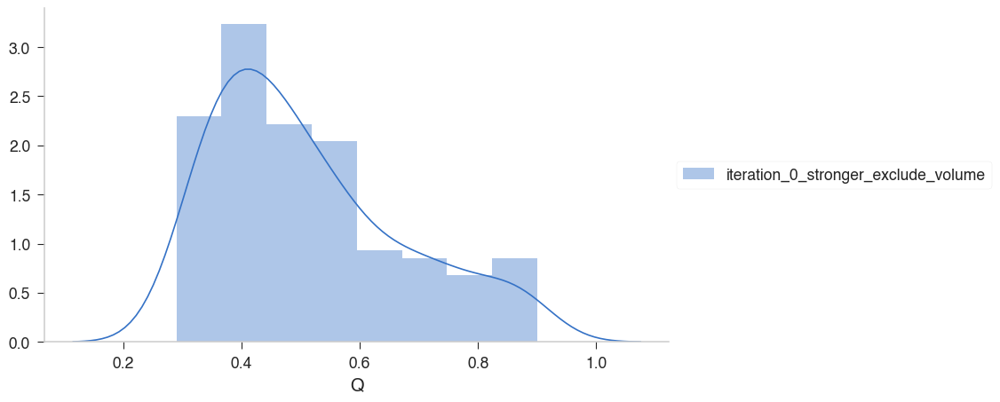

In [385]:
sub_data = max_Q_data.query("Folder=='iteration_0_stronger_exclude_volume_stronger_side_chain' or\
                            Folder=='iteration_0_stronger_exclude_volume_stronger_side_chain_k4' or\
                            Folder=='iteration_0_stronger_exclude_volume'")

g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

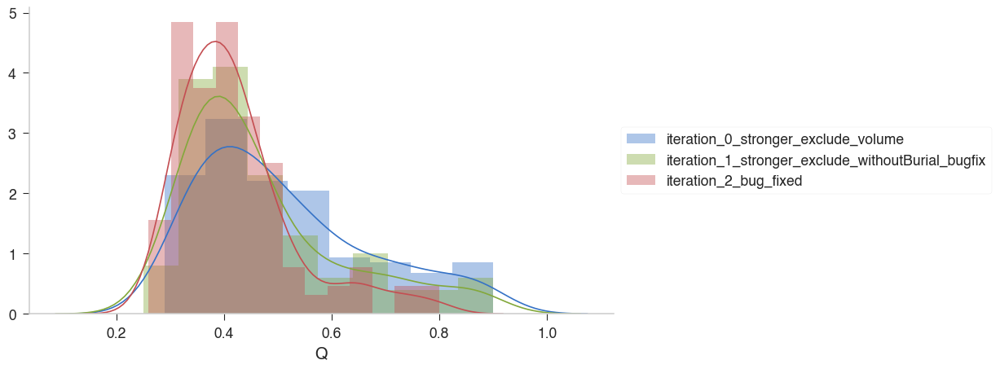

In [381]:
sub_data = max_Q_data.query("Folder=='iteration_1_stronger_exclude_withoutBurial_bugfix' or\
                            Folder=='iteration_2_bug_fixed' or\
                            Folder=='iteration_0_stronger_exclude_volume'")

g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

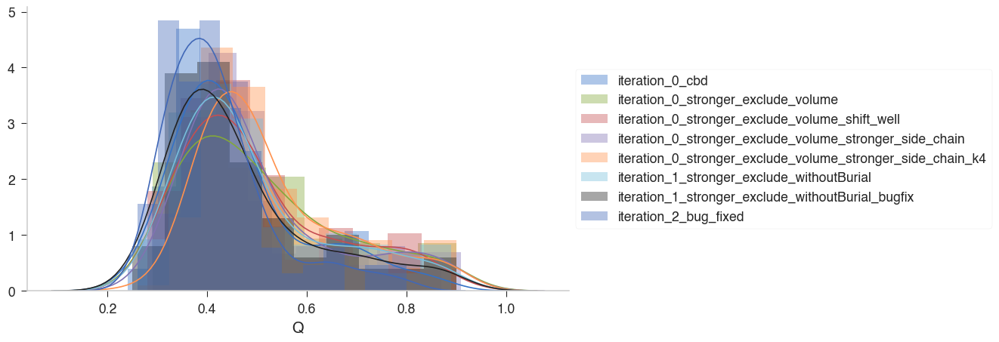

In [379]:
sub_data = max_Q_data.query("Folder!='iteration_1_stronger_exclude_withoutBurial' and Folder!='iteration_0_stronger_exclude_volume_k10'")

g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

In [370]:
sub_data.query("Protein == '1cxc'")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
504,2001,0.34,16.90,129.45,-581.40,-176.34,-490.84,11.00,29.51,5.47,-37.36,-4.21,0.0,-1114.71,0,1cxc,iteration_0_cbd
505,2001,0.38,15.30,126.61,-591.59,-182.24,-473.92,15.33,21.87,6.76,-45.44,-2.92,0.0,-1125.54,1,1cxc,iteration_0_cbd
506,2001,0.36,15.84,120.94,-584.20,-162.74,-471.62,9.97,22.78,10.51,-37.68,-4.27,0.0,-1096.32,0,1cxc,iteration_0_stronger_exclude_volume
507,2001,0.42,13.97,127.13,-598.39,-188.00,-447.45,9.78,16.10,10.19,-32.40,-3.93,0.0,-1106.97,1,1cxc,iteration_0_stronger_exclude_volume
508,2001,0.43,14.52,132.44,-591.39,-199.72,-470.68,7.79,26.62,9.37,-33.94,-4.24,0.0,-1123.74,0,1cxc,iteration_0_stronger_exclude_volume_shift_well
509,2001,0.42,13.40,127.27,-577.91,-206.70,-460.03,8.98,27.00,11.05,-40.71,-0.86,0.0,-1111.92,1,1cxc,iteration_0_stronger_exclude_volume_shift_well
510,2001,0.41,12.67,126.64,-594.37,-183.04,-454.81,19.16,18.11,7.77,-40.10,-2.40,0.0,-1103.05,0,1cxc,iteration_1_stronger_exclude_withoutBurial
511,2001,0.40,12.85,118.25,-601.09,-187.24,-435.86,16.35,26.24,6.71,-40.48,-5.07,0.0,-1102.19,1,1cxc,iteration_1_stronger_exclude_withoutBurial
512,2001,0.44,12.52,114.67,-600.65,-215.52,-434.71,17.67,30.18,5.60,-38.67,-4.39,0.0,-1125.80,0,1cxc,iteration_1_stronger_exclude_withoutBurial_bugfix
513,2001,0.38,12.47,126.20,-599.81,-202.05,-435.06,22.24,34.40,8.54,-46.86,-5.69,0.0,-1098.09,1,1cxc,iteration_1_stronger_exclude_withoutBurial_bugfix


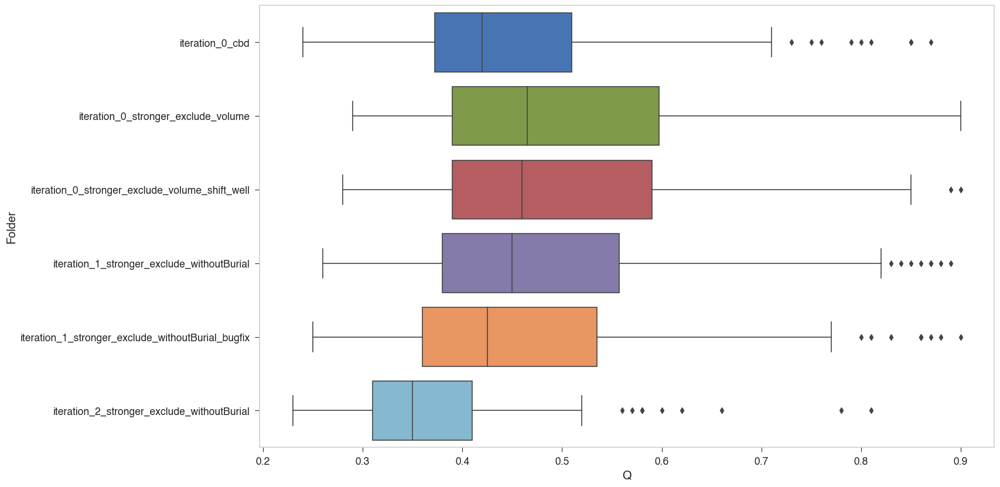

In [367]:
sns.boxplot("Q", "Folder", data=sub_data)

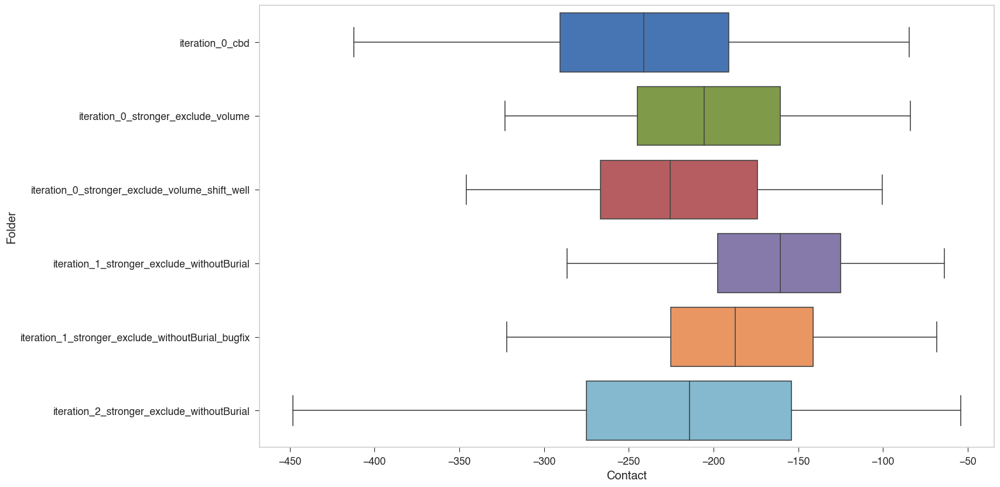

In [349]:
sns.boxplot("Contact", "Folder", data=sub_data)

In [331]:
a = sub_data.query("Folder == 'iteration_0_stronger_exclude_volume'")[["Q", "Contact", "Fragment", "Exclude_Side", "Run", "Protein", "Folder"]].reset_index(drop=True)
b = sub_data.query("Folder == 'iteration_2_stronger_exclude_withoutBurial'")[["Q", "Contact", "Fragment", "Exclude_Side", "Run", "Protein", "Folder"]].reset_index(drop=True)

In [332]:
c = a.merge(b, on=["Run", "Protein"])

In [333]:
c["Q_diff"] = c["Q_x"] - c["Q_y"]

In [334]:
c.sort_values("Contact_y").head()

,Q_x,Contact_x,Fragment_x,Exclude_Side_x,Run,Protein,Folder_x,Q_y,Contact_y,Fragment_y,Exclude_Side_y,Folder_y,Q_diff
112,0.59,-155.38,-542.42,10.74,0,1kuh,iteration_0_stronger_exclude_volume,0.27,-448.11,-403.40,27.65,iteration_2_stronger_exclude_withoutBurial,0.32
98,0.33,-222.25,-460.68,12.24,0,1rie,iteration_0_stronger_exclude_volume,0.29,-397.16,-377.11,29.10,iteration_2_stronger_exclude_withoutBurial,0.04
124,0.31,-319.96,-550.69,21.14,0,1lcl,iteration_0_stronger_exclude_volume,0.33,-392.24,-503.10,34.80,iteration_2_stronger_exclude_withoutBurial,-0.02
113,0.35,-115.85,-509.35,7.40,1,1kuh,iteration_0_stronger_exclude_volume,0.27,-391.02,-413.79,32.66,iteration_2_stronger_exclude_withoutBurial,0.08
99,0.37,-211.56,-483.88,21.98,1,1rie,iteration_0_stronger_exclude_volume,0.23,-388.38,-356.10,18.40,iteration_2_stronger_exclude_withoutBurial,0.14


In [338]:
c.sort_values("Q_diff").tail()

,Q_x,Contact_x,Fragment_x,Exclude_Side_x,Run,Protein,Folder_x,Q_y,Contact_y,Fragment_y,Exclude_Side_y,Folder_y,Q_diff
51,0.84,-226.91,-468.39,13.12,1,1erv,iteration_0_stronger_exclude_volume,0.37,-156.67,-413.84,11.19,iteration_2_stronger_exclude_withoutBurial,0.47
138,0.82,-323.19,-630.06,26.13,0,1jon,iteration_0_stronger_exclude_volume,0.34,-251.84,-560.16,20.89,iteration_2_stronger_exclude_withoutBurial,0.48
8,0.90,-152.14,-343.97,12.17,0,1bdo,iteration_0_stronger_exclude_volume,0.42,-152.10,-280.41,11.09,iteration_2_stronger_exclude_withoutBurial,0.48
104,0.85,-239.43,-557.52,15.13,0,1pdo,iteration_0_stronger_exclude_volume,0.35,-204.92,-496.63,15.29,iteration_2_stronger_exclude_withoutBurial,0.50
68,0.86,-226.62,-510.30,15.10,0,1a6f,iteration_0_stronger_exclude_volume,0.32,-155.32,-452.98,7.65,iteration_2_stronger_exclude_withoutBurial,0.54


In [339]:
sub_data.query("Protein == '1erv'")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
398,2001,0.65,12.55,121.06,-683.69,-228.09,-453.84,20.23,17.05,5.21,-44.26,-12.41,0.0,-1258.73,0,1erv,iteration_0_stronger_exclude_volume
399,2001,0.84,12.41,122.04,-702.46,-226.91,-468.39,13.12,19.60,5.37,-47.43,-12.39,0.0,-1297.44,1,1erv,iteration_0_stronger_exclude_volume
408,2001,0.44,14.10,107.93,-700.98,-123.43,-435.73,6.35,20.27,5.41,-31.94,-4.70,0.0,-1156.81,0,1erv,iteration_2_stronger_exclude_withoutBurial
409,2001,0.37,14.87,107.29,-699.10,-156.67,-413.84,11.19,25.26,6.27,-37.00,-4.26,0.0,-1160.86,1,1erv,iteration_2_stronger_exclude_withoutBurial


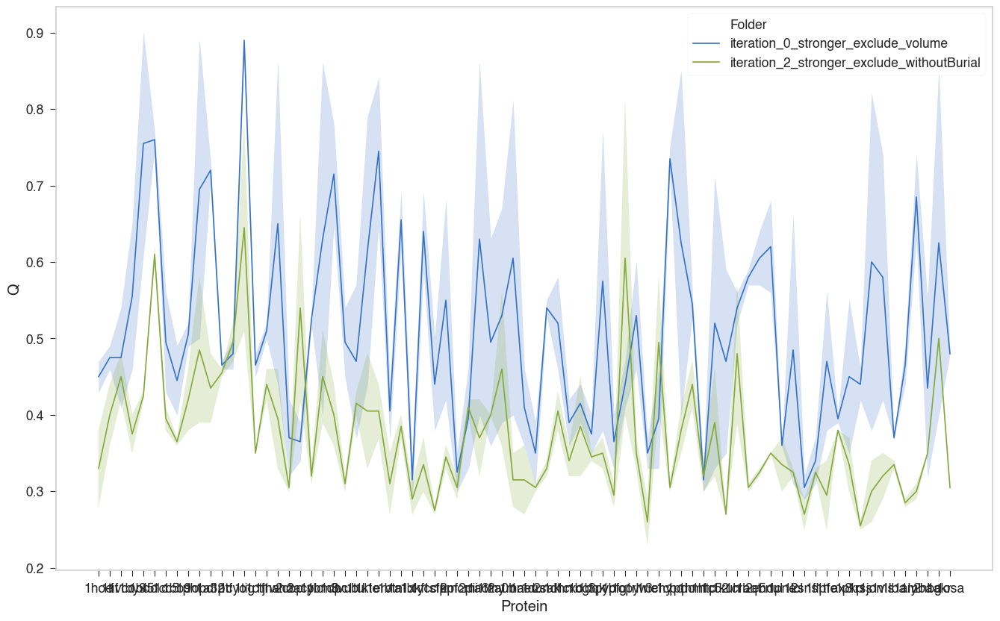

In [335]:
sub_data = max_Q_data.query("Folder=='iteration_0_stronger_exclude_volume' or Folder=='iteration_2_stronger_exclude_withoutBurial'")
sns.lineplot("Protein", "Q", hue="Folder", data=sub_data)

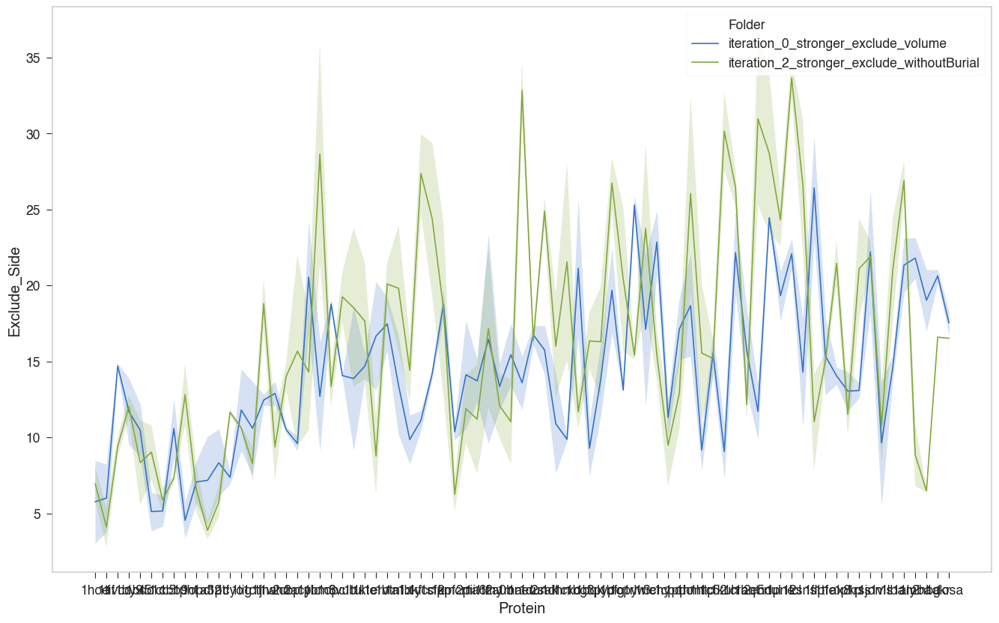

In [336]:
sub_data = max_Q_data.query("Folder=='iteration_0_stronger_exclude_volume' or Folder=='iteration_2_stronger_exclude_withoutBurial'")
sns.lineplot("Protein", "Exclude_Side", hue="Folder", data=sub_data)

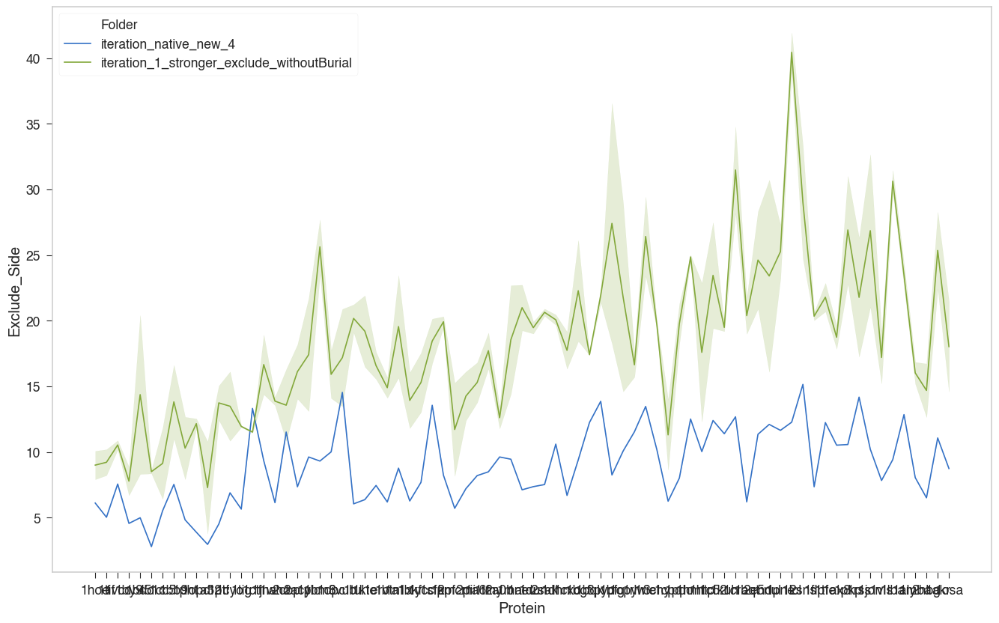

In [323]:
a = pd.concat([selected, selected2])
sns.lineplot("Protein", "Exclude_Side", hue="Folder", data=a)

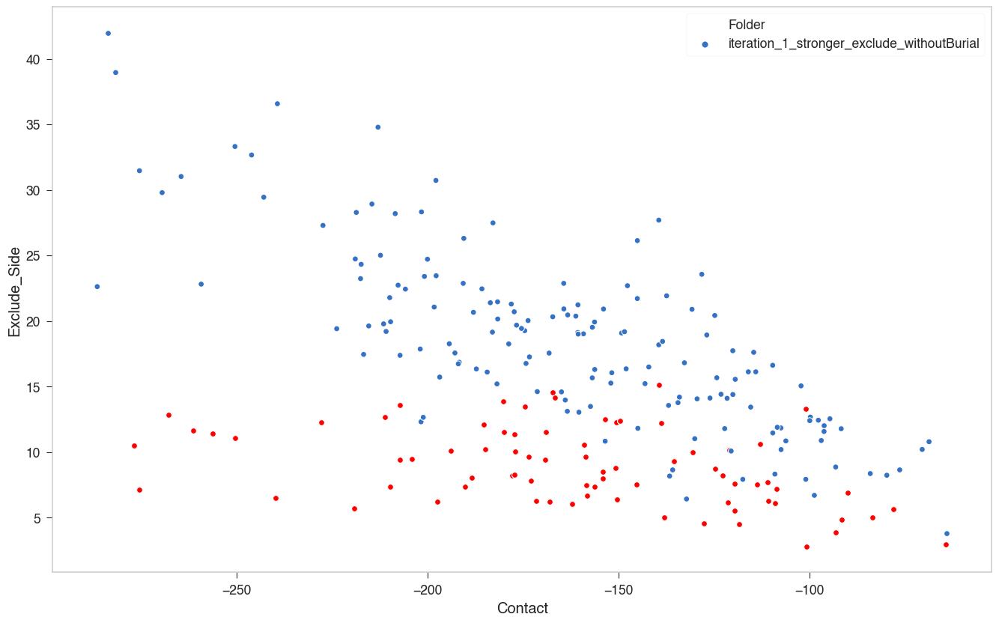

In [321]:

selected = data.query("Folder == 'iteration_native_new_4' and Steps == 0").reset_index(drop=True)
selected2 = data.query("Folder == 'iteration_1_stronger_exclude_withoutBurial' and Steps == 2001").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", data=selected, color="red")
sns.scatterplot("Contact", "Exclude_Side", hue="Folder", data=selected2)

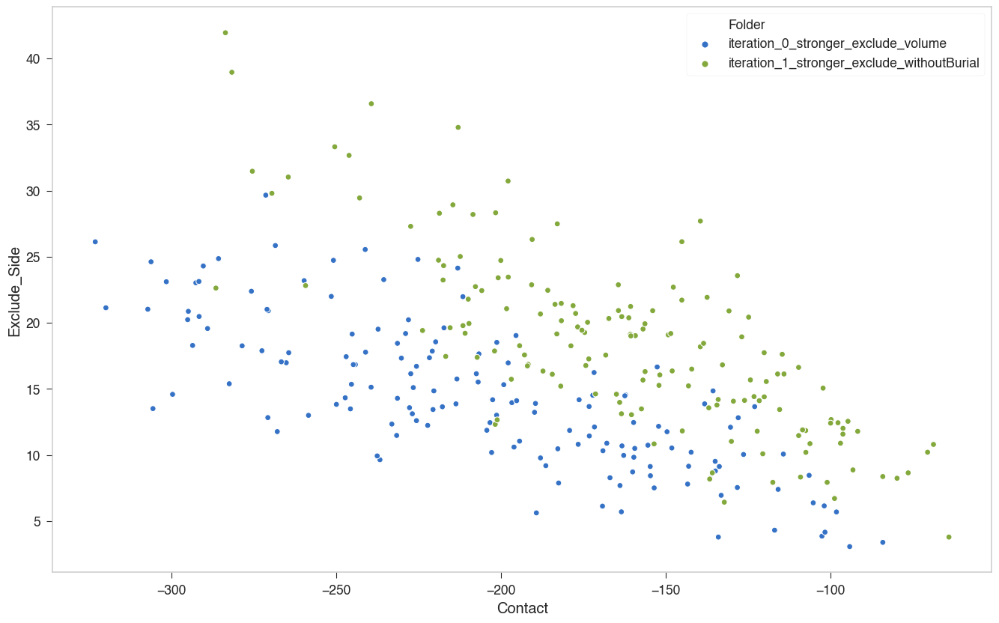

In [307]:

# selected = data.query("Folder == 'iteration_0_stronger_exclude_volume_k10' and Steps == 2001").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Folder", data=sub_data)

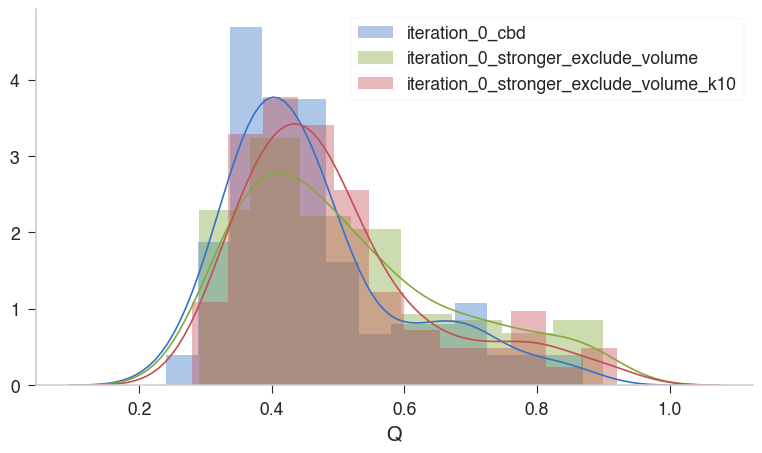

In [255]:
sub_data = max_Q_data.query("Folder=='iteration_0_cbd' or Folder=='iteration_0_stronger_exclude_volume' or Folder=='iteration_0_stronger_exclude_volume_k10'")
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend()

In [259]:
selected.query("Protein == '1vcc'")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
4,2001,0.41,11.19,76.21,-307.50,-162.17,-295.54,14.55,20.58,3.27,-23.72,-2.2,0.0,-676.51,0,1vcc,iteration_0_stronger_exclude_volume
5,2001,0.54,11.37,83.80,-309.74,-135.61,-319.18,14.85,15.85,3.68,-40.33,-8.2,0.0,-694.88,1,1vcc,iteration_0_stronger_exclude_volume


In [258]:
selected = data.query("Folder == 'iteration_0_stronger_exclude_volume' and Steps == 2001").reset_index(drop=True)
selected.sort_values("Q").head(5)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
126,2001,0.29,20.02,139.44,-569.22,-176.55,-540.28,10.81,35.49,3.97,-40.91,-11.27,0.0,-1148.53,0,2sns,iteration_0_stronger_exclude_volume
57,2001,0.29,13.95,108.34,-510.78,-166.90,-367.82,8.28,19.23,3.50,-30.10,-8.22,0.0,-944.47,1,1bkf,iteration_0_stronger_exclude_volume
108,2001,0.30,15.17,134.05,-600.10,-182.50,-501.64,7.88,20.45,4.66,-51.80,-12.63,0.0,-1181.64,0,1htp,iteration_0_stronger_exclude_volume
64,2001,0.30,14.24,116.53,-579.71,-167.87,-399.65,10.89,11.63,3.67,-66.11,-24.21,0.0,-1094.82,0,2mcm,iteration_0_stronger_exclude_volume
129,2001,0.31,14.79,147.77,-992.58,-259.76,-555.86,23.19,29.54,9.57,-52.06,-0.00,0.0,-1650.19,1,1flp,iteration_0_stronger_exclude_volume


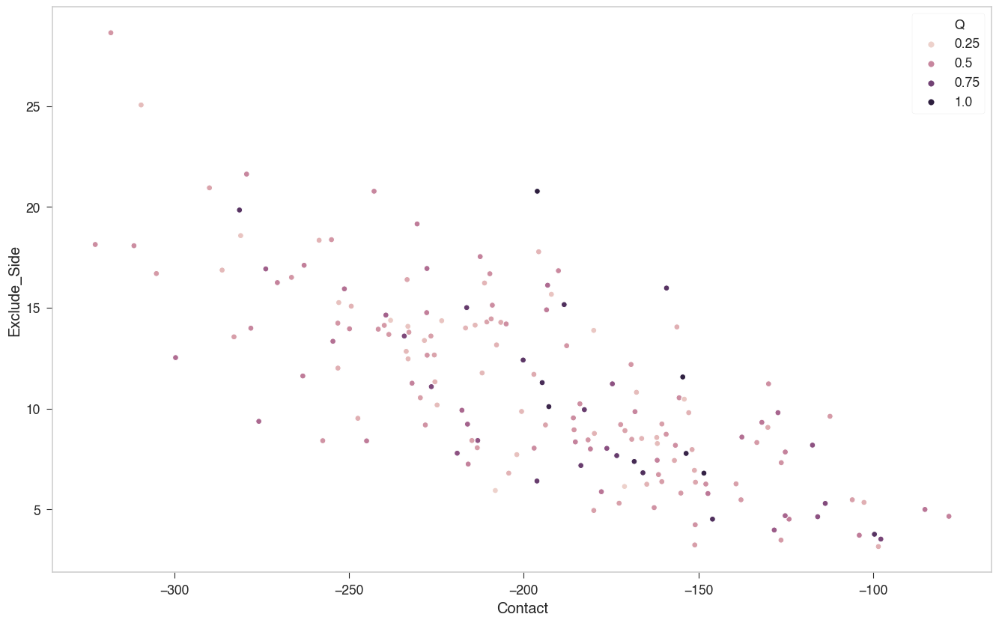

In [237]:

selected = data.query("Folder == 'iteration_0_stronger_exclude_volume_k10' and Steps == 2001").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [239]:
selected.sort_values("Exclude_Side").tail(5)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
87,2001,0.50,14.04,131.31,-622.67,-242.89,-501.27,20.78,27.93,2.88,-47.77,-12.43,0.0,-1244.11,1,1mai,iteration_0_stronger_exclude_volume_k10
160,2001,0.41,14.84,138.54,-842.09,-290.04,-599.22,20.95,29.81,11.05,-57.18,-8.09,0.0,-1596.26,0,1jon,iteration_0_stronger_exclude_volume_k10
116,2001,0.50,13.74,129.96,-650.58,-279.41,-521.13,21.63,20.84,6.89,-51.14,-3.62,0.0,-1326.57,0,3chy,iteration_0_stronger_exclude_volume_k10
161,2001,0.34,14.49,148.85,-851.20,-309.61,-552.92,25.06,31.25,8.00,-65.24,-12.75,0.0,-1578.57,1,1jon,iteration_0_stronger_exclude_volume_k10
142,2001,0.45,13.34,148.37,-749.66,-318.28,-523.29,28.64,30.52,8.35,-59.29,-8.52,0.0,-1443.17,0,5nul,iteration_0_stronger_exclude_volume_k10


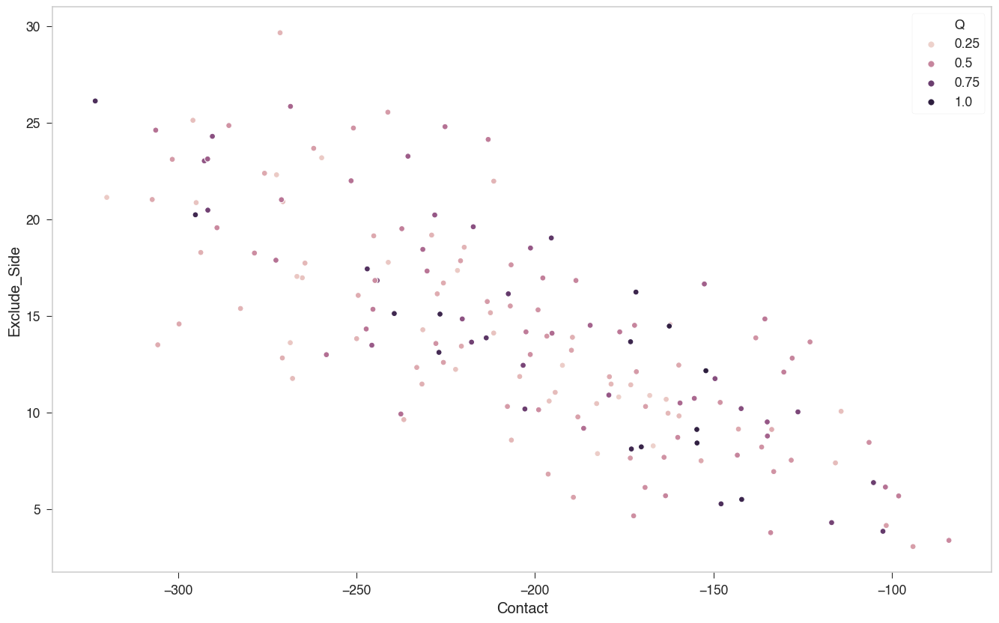

In [240]:

selected = data.query("Folder == 'iteration_0_stronger_exclude_volume' and Steps == 2001").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [241]:
selected.sort_values("Exclude_Side").tail(5)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
92,2001,0.34,12.93,123.10,-392.07,-295.82,-464.13,25.13,28.31,5.31,-56.66,-12.04,0.0,-1038.87,0,1b6e,iteration_0_stronger_exclude_volume
101,2001,0.44,13.91,133.36,-850.41,-241.22,-545.73,25.55,30.14,10.32,-38.72,-0.00,0.0,-1476.71,1,1bgf,iteration_0_stronger_exclude_volume
112,2001,0.60,15.51,134.35,-499.12,-268.50,-564.81,25.85,20.48,2.21,-74.28,-29.11,0.0,-1252.92,0,1rlw,iteration_0_stronger_exclude_volume
160,2001,0.82,13.43,143.42,-845.31,-323.19,-630.06,26.13,25.88,7.92,-89.57,-14.78,0.0,-1699.56,0,1jon,iteration_0_stronger_exclude_volume
150,2001,0.37,14.05,141.28,-995.48,-271.41,-554.85,29.66,19.20,13.38,-54.14,-0.00,0.0,-1672.36,0,1flp,iteration_0_stronger_exclude_volume


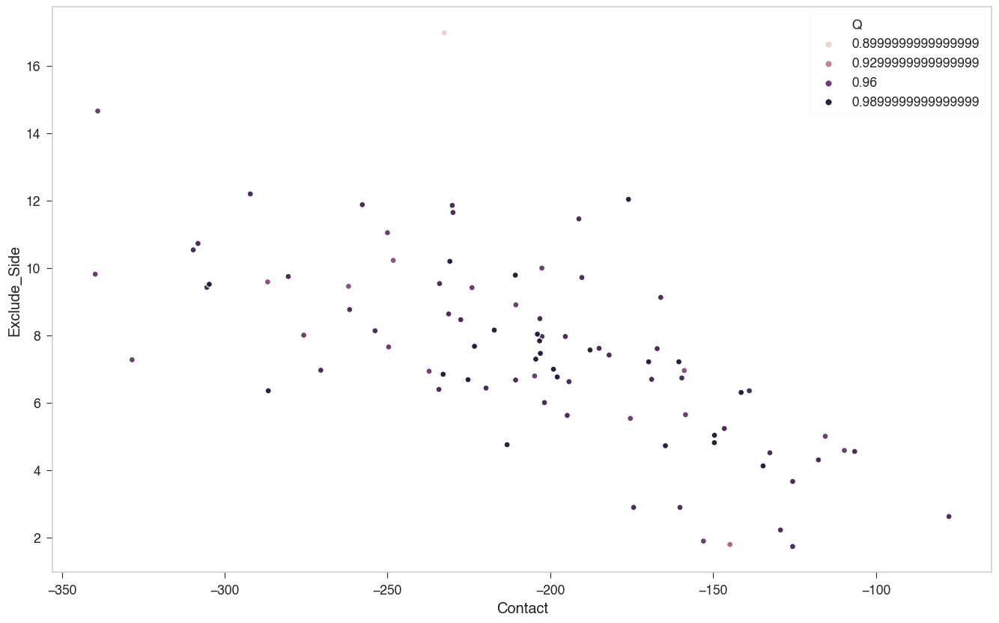

In [212]:

selected = data.query("Folder == 'iteration_native_new_4' and Steps == 1").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [213]:
selected.sort_values("Exclude_Side").tail(1)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
76,1,0.9,11.97,43.24,-366.01,-232.58,-480.27,16.98,-22.6,2.0,-70.34,-10.26,0.0,-1119.84,0,1by2,iteration_native_new_4


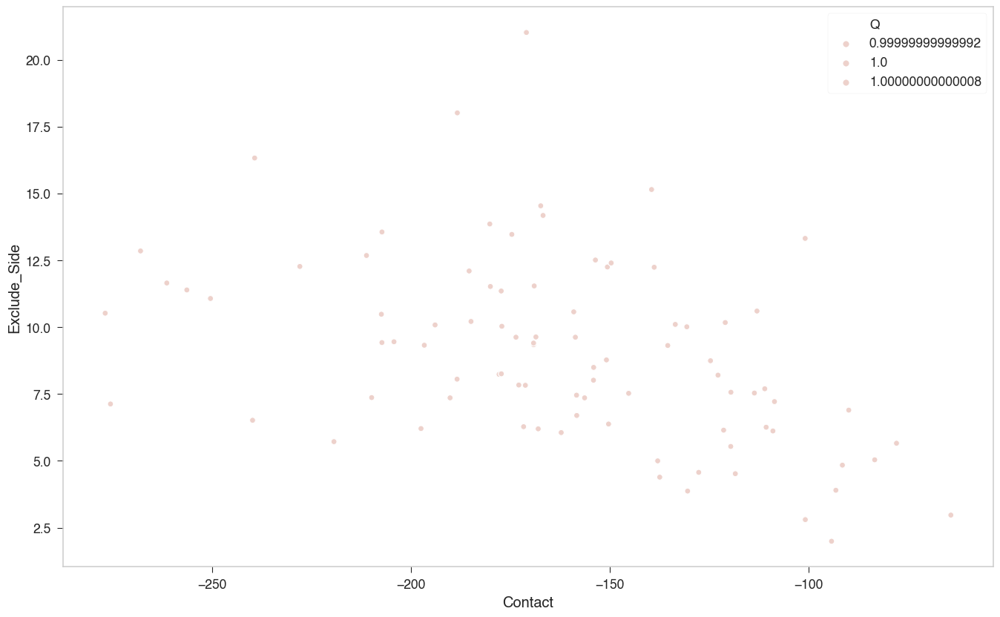

In [214]:

selected = data.query("Folder == 'iteration_native_new_4' and Steps == 0").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [215]:
selected.sort_values("Exclude_Side").tail(1)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
76,0,1.0,12.13,3543.07,-286.47,-170.95,-541.52,21.04,-1.87,447.5,-54.19,-7.52,0.0,2949.09,0,1by2,iteration_native_new_4


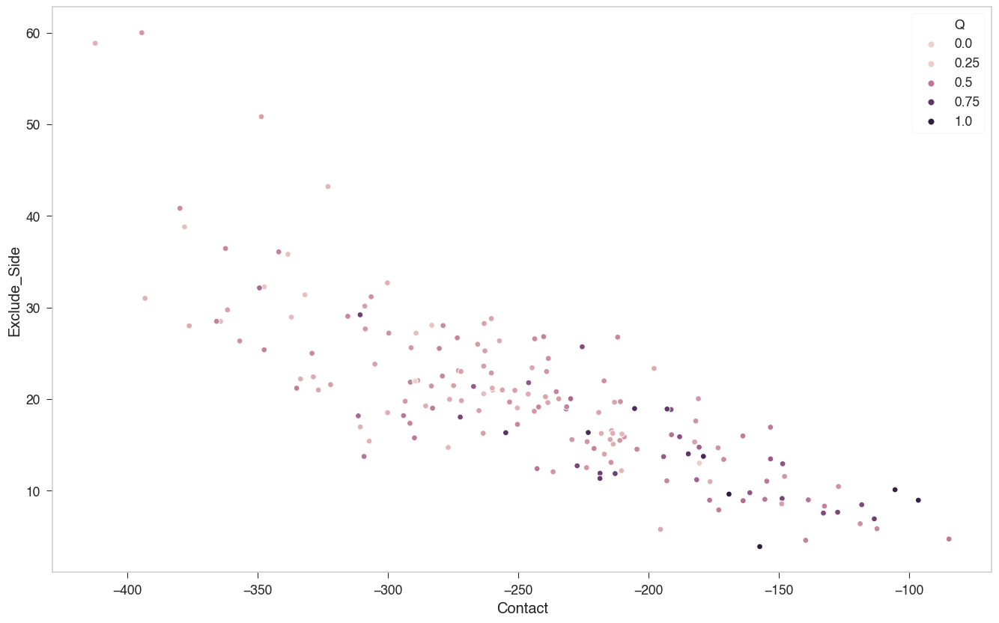

In [202]:
selected = data.query("Folder == 'iteration_0_cbd' and Steps > 2000").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

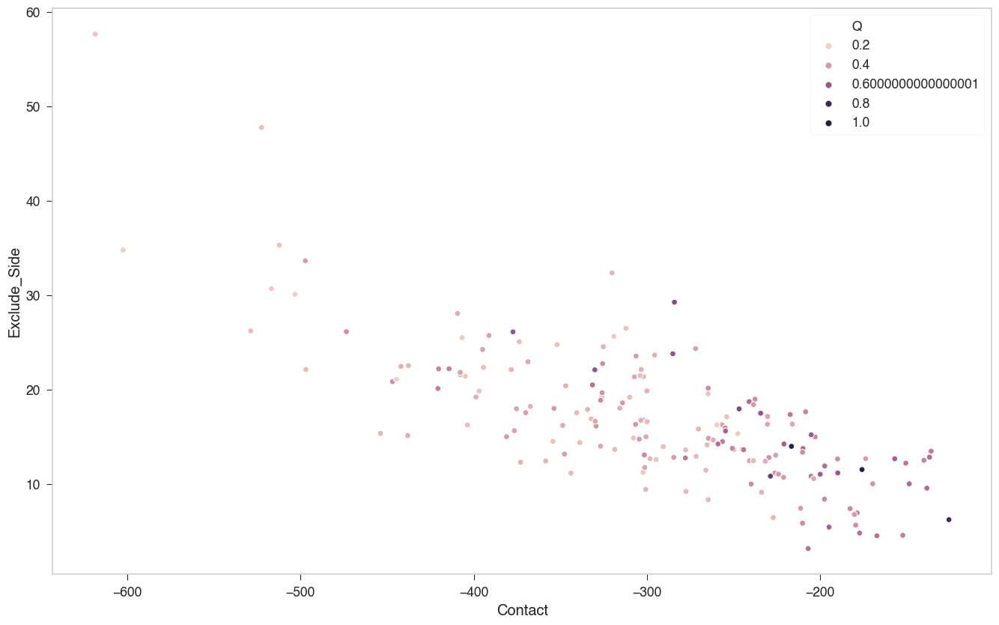

In [203]:
selected = data.query("Folder == 'iteration_new_4' and Steps > 2000").reset_index(drop=True)
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [219]:
selected = data.query("Folder == 'iteration_new_4_without_burial' and Steps > 2000").reset_index(drop=True)

In [220]:
selected["ratio"] = selected["Contact"] / selected["Fragment"]

In [217]:
gammaFile = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4_withoutBurial/saved_gammas/new_4_cutoff600_impose_Aprime_constraint"

def get_contact_gamma_info(gammaFile):
    # check the gamma.
    # read in gamma, and sort by size.
    # gammaFile = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4_withoutBurial/saved_gammas/new_4_cutoff600_impose_Aprime_constraint"
    gamma = np.loadtxt(gammaFile)

    res_type_map_letters = ['A', 'R', 'N', 'D', 'C', 'Q', 'E', 'G',
                            'H', 'I', 'L', 'K', 'M', 'F', 'P', 'S', 'T', 'W', 'Y', 'V']

    inverse_res_type_map = dict(list(zip(list(range(20)), res_type_map_letters)))
    c = 0
    info_ = []
    for i in range(20):
        for j in range(i, 20):
            info_.append(["Direct", res_type_map_letters[i], res_type_map_letters[j], c, round(gamma[c],3)])
            if i != j:
                info_.append(["Direct", res_type_map_letters[j], res_type_map_letters[i], c, round(gamma[c],3)])
            c += 1
    for i in range(20):
        for j in range(i, 20):
            info_.append(["Protein", res_type_map_letters[i], res_type_map_letters[j], c, round(gamma[c],3)])
            if i != j:
                info_.append(["Protein", res_type_map_letters[j], res_type_map_letters[i], c, round(gamma[c],3)])
            info_.append(["Water", res_type_map_letters[i], res_type_map_letters[j], c+210, round(gamma[c+210],3)])
            if i != j:
                info_.append(["Water", res_type_map_letters[j], res_type_map_letters[i], c+210, round(gamma[c+210],3)])
            c += 1
    contact_gammas = pd.DataFrame(info_, columns=["Interaction", "Res1", "Res2", "Index", "Gamma"])
    return contact_gammas

In [187]:
# check the gamma.
# read in gamma, and sort by size.
gammaFile = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4_withoutBurial/saved_gammas/new_4_cutoff600_impose_Aprime_constraint"
gamma = np.loadtxt(gammaFile)

res_type_map_letters = ['A', 'R', 'N', 'D', 'C', 'Q', 'E', 'G',
                        'H', 'I', 'L', 'K', 'M', 'F', 'P', 'S', 'T', 'W', 'Y', 'V']

inverse_res_type_map = dict(list(zip(list(range(20)), res_type_map_letters)))
c = 0
info_ = []
for i in range(20):
    for j in range(i, 20):
        info_.append(["Direct", res_type_map_letters[i], res_type_map_letters[j], c, round(gamma[c],3)])
        if i != j:
            info_.append(["Direct", res_type_map_letters[j], res_type_map_letters[i], c, round(gamma[c],3)])
        c += 1
for i in range(20):
    for j in range(i, 20):
        info_.append(["Protein", res_type_map_letters[i], res_type_map_letters[j], c, round(gamma[c],3)])
        if i != j:
            info_.append(["Protein", res_type_map_letters[j], res_type_map_letters[i], c, round(gamma[c],3)])
        info_.append(["Water", res_type_map_letters[i], res_type_map_letters[j], c+210, round(gamma[c+210],3)])
        if i != j:
            info_.append(["Water", res_type_map_letters[j], res_type_map_letters[i], c+210, round(gamma[c+210],3)])
        c += 1

In [188]:
len(gamma)

630

In [193]:
contact_gammas = pd.DataFrame(info_, columns=["Interaction", "Res1", "Res2", "Index", "Gamma"])

In [216]:
contact_gammas.sort_values("Gamma").head()

,Interaction,Res1,Res2,Index,Gamma
180,Direct,Q,H,93,-4.963
181,Direct,H,Q,93,-4.963
160,Direct,M,C,82,-4.654
159,Direct,C,M,82,-4.654
172,Direct,Y,C,88,-4.012


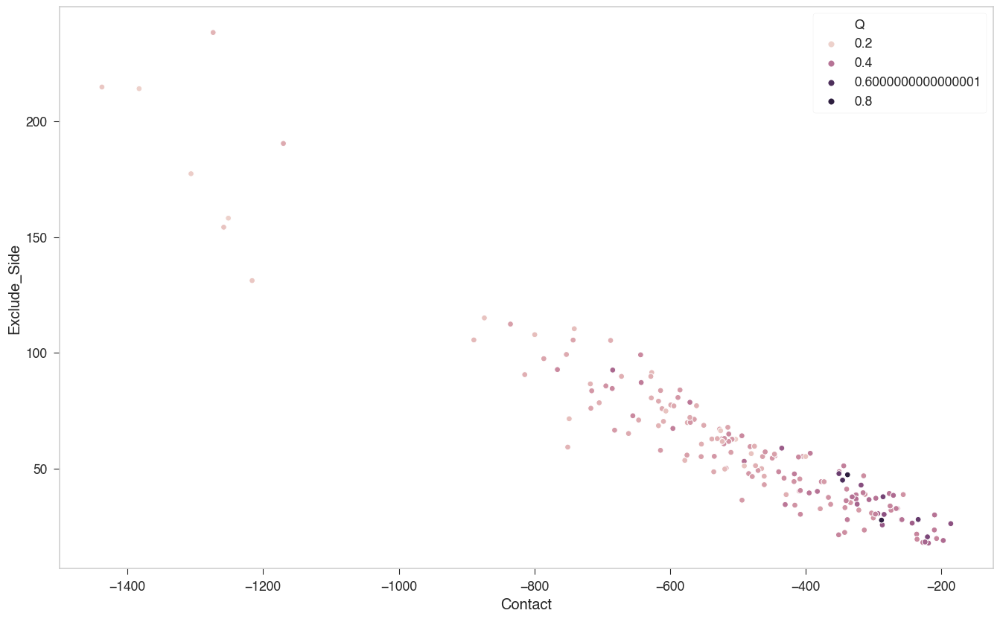

In [197]:
sns.scatterplot("Contact", "Exclude_Side", hue="Q", data=selected)

In [222]:
selected.sort_values("ratio").tail(1)

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder,ratio
81,2001,0.22,10.31,153.19,-469.05,-1437.49,-227.44,214.79,78.21,32.92,-60.61,-5.98,0.0,-1721.46,1,1poa,iteration_new_4_without_burial,6.320304


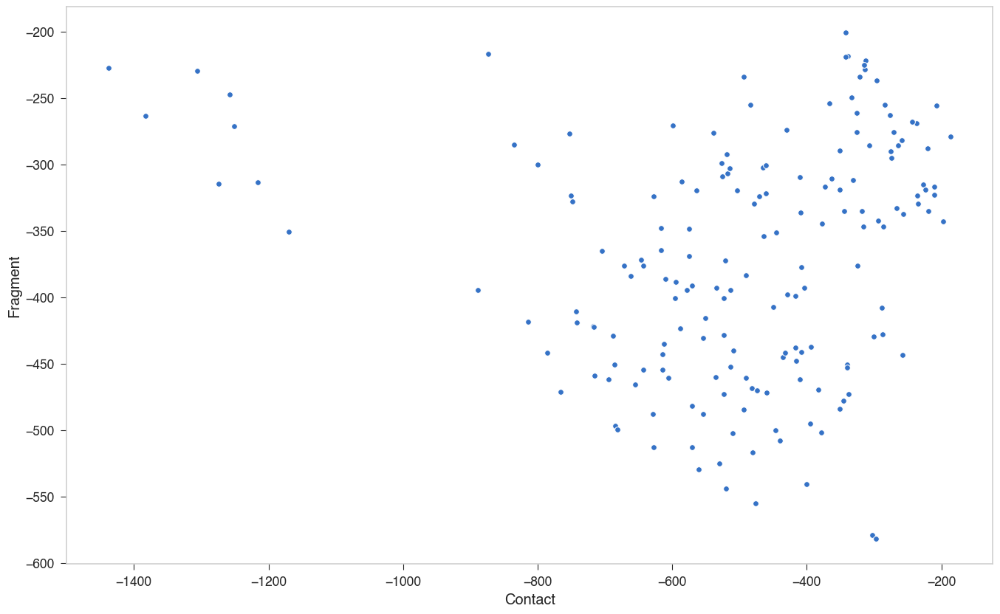

In [184]:
sns.scatterplot("Contact", "Fragment", data=selected)

In [168]:
sub_data.query("Protein == '7rsa'")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
1020,2001,0.31,14.75,148.88,-561.78,-210.33,-483.73,12.19,26.70,6.07,-56.02,-13.29,0.0,-1131.32,0,7rsa,iteration_0_cbd
1021,2001,0.74,14.42,132.17,-549.82,-192.81,-543.72,18.93,24.95,4.79,-67.14,-15.43,0.0,-1188.08,1,7rsa,iteration_0_cbd
1022,251,0.66,14.93,192.57,-535.22,-289.49,-521.89,17.26,47.07,6.71,-69.05,-15.03,0.0,-1167.08,0,7rsa,iteration_native_new_4
1023,251,0.70,14.63,197.82,-531.77,-309.60,-513.80,20.79,50.52,6.93,-73.05,-17.90,0.0,-1170.05,1,7rsa,iteration_native_new_4
1024,2001,0.35,17.25,133.94,-558.49,-345.38,-512.81,11.23,21.93,5.05,-55.89,-9.32,0.0,-1309.73,0,7rsa,iteration_new_1
1025,2001,0.33,16.99,124.59,-552.37,-338.08,-496.07,13.67,18.02,4.45,-46.84,-10.63,0.0,-1283.25,1,7rsa,iteration_new_1
1026,2001,0.38,14.82,130.13,-553.52,-260.42,-502.82,10.56,28.28,2.94,-44.31,-6.85,0.0,-1196.02,0,7rsa,iteration_new_2
1027,2001,0.31,15.07,131.80,-558.35,-259.80,-488.27,8.20,24.26,4.64,-20.19,-6.65,0.0,-1164.35,1,7rsa,iteration_new_2
1030,2001,0.31,15.05,145.18,-546.51,-407.78,-454.57,21.54,24.82,3.31,-68.11,-11.98,0.0,-1294.10,0,7rsa,iteration_new_4
1031,2001,0.40,14.25,129.47,-555.43,-381.02,-474.58,14.99,34.86,5.46,-60.97,-13.99,0.0,-1301.21,1,7rsa,iteration_new_4


In [161]:
a = selected.query("Steps == 1").reset_index(drop=True)

In [162]:
a.sort_values("SideChain")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
171,1,0.98,14.57,33.92,-977.76,-286.61,-656.86,6.36,-46.21,2.62,-59.78,-0.00,0.0,-1984.31,1,2hbg,iteration_native_new_4
170,1,0.98,14.57,33.92,-977.76,-286.61,-656.86,6.36,-46.21,2.62,-59.78,-0.00,0.0,-1984.31,0,2hbg,iteration_native_new_4
169,1,0.98,14.76,50.74,-1094.70,-232.93,-689.80,6.85,-46.09,2.92,-59.52,-0.00,0.0,-2062.52,1,1mba,iteration_native_new_4
168,1,0.98,14.76,50.74,-1094.70,-232.93,-689.80,6.85,-46.09,2.92,-59.52,-0.00,0.0,-2062.52,0,1mba,iteration_native_new_4
121,1,0.98,15.63,37.50,-832.32,-149.63,-588.17,5.04,-44.85,1.54,-55.33,-0.00,0.0,-1626.21,1,1cpq,iteration_native_new_4
120,1,0.98,15.63,37.50,-832.32,-149.63,-588.17,5.04,-44.85,1.54,-55.33,-0.00,0.0,-1626.21,0,1cpq,iteration_native_new_4
150,1,0.98,14.71,42.26,-954.83,-225.29,-637.66,6.69,-44.76,1.81,-57.08,-0.00,0.0,-1868.86,0,1flp,iteration_native_new_4
151,1,0.98,14.71,42.26,-954.83,-225.29,-637.66,6.69,-44.76,1.81,-57.08,-0.00,0.0,-1868.86,1,1flp,iteration_native_new_4
70,1,0.97,13.21,28.91,-572.99,-261.64,-484.98,8.77,-41.49,1.53,-106.49,-27.45,0.0,-1455.82,0,2mcm,iteration_native_new_4
71,1,0.97,13.21,28.91,-572.99,-261.64,-484.98,8.77,-41.49,1.53,-106.49,-27.45,0.0,-1455.82,1,2mcm,iteration_native_new_4


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3e1d5390>]],
      dtype=object)

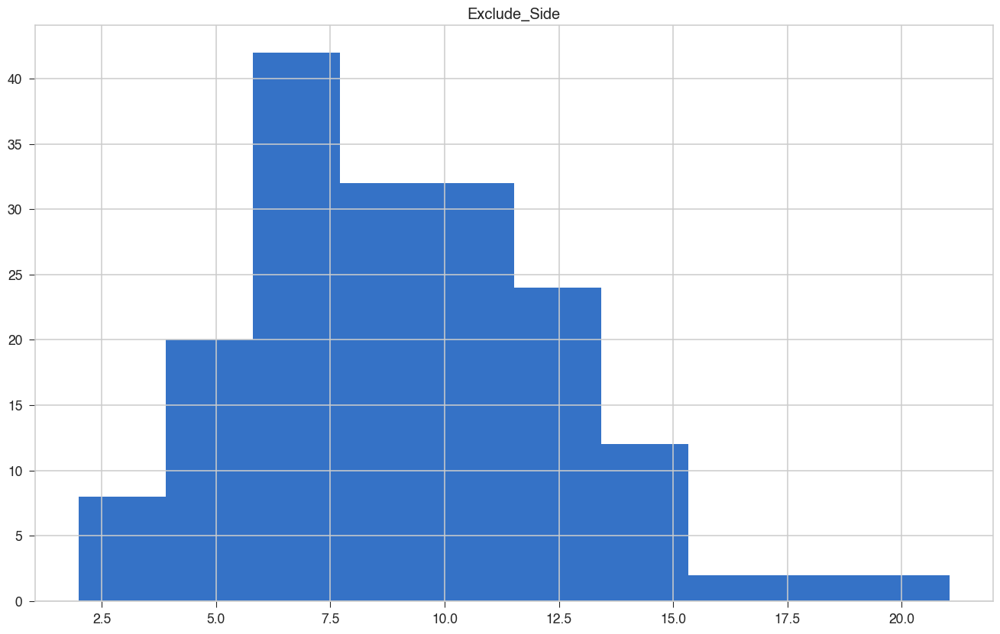

In [159]:
a.hist("Exclude_Side")

In [108]:
sub_data.query("Folder == 'iteration_new_2'").sort_values("Q")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
1264,2001,0.28,20.36,150.91,-655.35,-193.59,-609.63,11.19,22.83,8.11,-69.03,-12.66,0.0,-1347.22,0,1div,iteration_new_2
677,2001,0.28,15.25,134.16,-388.56,-280.16,-468.93,12.52,32.00,3.86,-52.52,-7.10,0.0,-1014.72,1,1b6e,iteration_new_2
901,2001,0.28,14.82,136.72,-556.60,-282.37,-475.42,11.77,27.78,10.23,-50.32,-5.90,0.0,-1184.11,1,3lzt,iteration_new_2
425,2001,0.30,15.72,125.60,-533.89,-175.98,-407.92,13.74,26.67,4.61,-82.70,-26.27,0.0,-1056.14,1,1a1x,iteration_new_2
593,2001,0.30,15.73,123.31,-626.46,-255.99,-448.48,8.28,33.22,12.48,-40.08,-4.12,0.0,-1197.84,1,1poa,iteration_new_2
831,2001,0.30,13.10,135.25,-538.83,-291.93,-460.68,16.96,21.31,6.91,-53.16,-12.71,0.0,-1176.87,1,1rie,iteration_new_2
550,2001,0.31,12.87,113.91,-358.49,-257.37,-390.48,11.16,24.15,5.40,-60.50,-7.70,0.0,-919.90,0,1by2,iteration_new_2
1152,2001,0.31,14.19,138.97,-845.44,-268.03,-573.67,18.60,32.77,8.68,-66.89,-8.81,0.0,-1563.83,0,1jon,iteration_new_2
676,2001,0.31,15.27,144.01,-385.68,-277.66,-487.08,9.43,27.35,2.12,-40.78,-5.93,0.0,-1014.21,0,1b6e,iteration_new_2
747,2001,0.31,15.07,131.80,-558.35,-259.80,-488.27,8.20,24.26,4.64,-20.19,-6.65,0.0,-1164.35,1,7rsa,iteration_new_2


In [100]:
sub_data.query("Folder == 'iteration_start_native_iter5'").sort_values("Q")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
573,251,0.42,13.96,158.56,-583.02,-227.37,-449.44,10.23,39.96,16.49,-28.72,-2.42,0.0,-1065.73,1,1bea,iteration_start_native_iter5
586,251,0.44,13.75,184.31,-535.81,-231.13,-486.63,9.76,44.32,9.28,-50.54,-5.29,0.0,-1061.73,0,1rmd,iteration_start_native_iter5
587,251,0.44,13.66,174.37,-523.61,-246.44,-483.52,16.57,49.85,9.09,-41.93,-5.97,0.0,-1051.59,1,1rmd,iteration_start_native_iter5
1146,251,0.44,18.67,193.95,-900.15,-154.08,-593.40,13.13,48.63,13.45,-62.46,-3.99,0.0,-1444.92,0,1rss,iteration_start_native_iter5
1273,251,0.45,22.08,218.55,-634.58,-182.14,-633.87,14.84,52.40,7.95,-75.20,-15.92,0.0,-1247.98,1,1div,iteration_start_native_iter5
1258,251,0.45,22.27,204.68,-977.26,-176.80,-620.43,12.65,45.91,18.66,-53.36,-0.80,0.0,-1546.75,0,1osa,iteration_start_native_iter5
628,251,0.45,14.60,158.82,-897.95,-179.39,-461.79,12.30,43.61,13.68,-46.01,-0.00,0.0,-1356.72,0,2a0b,iteration_start_native_iter5
265,251,0.46,12.19,130.04,-496.72,-196.82,-356.50,8.19,32.15,15.55,-24.88,-0.23,0.0,-889.21,1,1rzl,iteration_start_native_iter5
40,251,0.46,12.86,101.36,-414.63,-135.61,-276.66,3.95,32.38,9.18,-19.29,-0.00,0.0,-699.31,0,1hyp,iteration_start_native_iter5
1259,251,0.47,20.97,224.68,-984.72,-184.83,-613.77,13.36,51.76,15.66,-55.55,-0.78,0.0,-1534.20,1,1osa,iteration_start_native_iter5


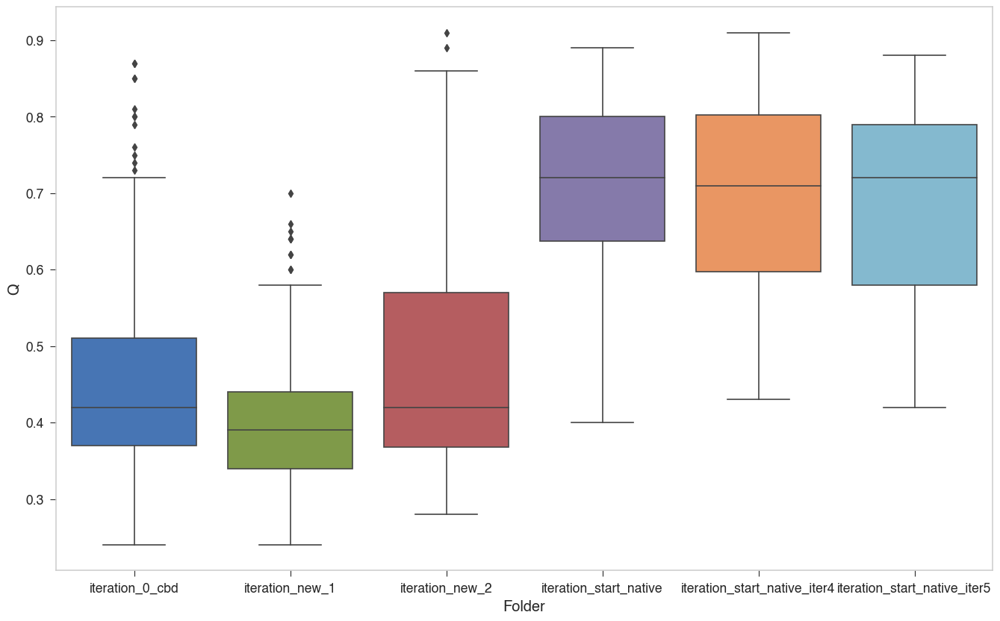

In [80]:
sns.boxplot("Folder", "Q", data=sub_data)

In [38]:
simulationType = "mass_iterative_run"
run_n = 2
folder_list = ["iteration_0_cbd", "iteration_1_cbd", "iteration_2_cbd", "iteration_start_native", "iteration_start_native_iter2"]
folder_list = ["iteration_0_cbd", "iteration_start_native", "iteration_start_native_iter2", 
               "iteration_start_native_iter3", "iteration_new_1"]


all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/mar_2020/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_new_1_03-10.csv


In [39]:
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_0_02-07.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_1_02-10.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_2_02-11.csv", index_col=0)
data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_new_1_03-10.csv", index_col=0)

sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)

In [40]:
y = "Steps"
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data

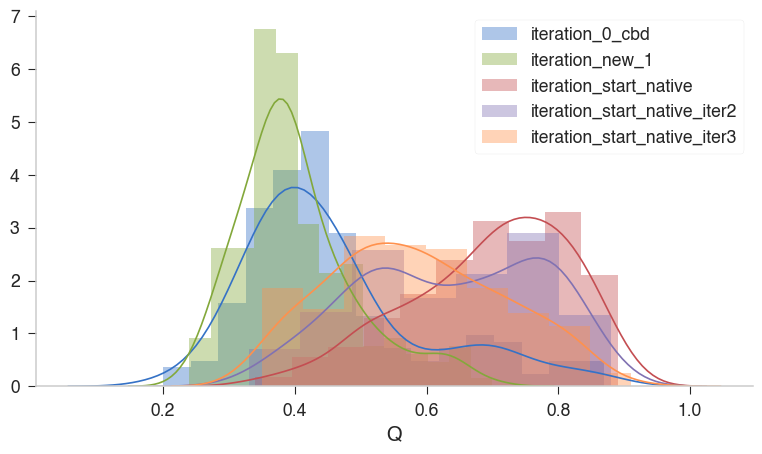

In [41]:
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend()

In [42]:
sub_data.query("Folder == 'iteration_start_native_iter3'").sort_values("Q")

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Exclude_Side,SideChain,Exclude,Beta,Pap,Helical,Total,Run,Protein,Folder
859,251,0.35,17.68,202.36,-971.96,-328.98,-549.92,10.71,47.91,15.17,-46.44,0.00,0.0,-1621.15,1,1flp,iteration_start_native_iter3
918,251,0.35,19.33,211.52,-1111.01,-261.76,-635.26,5.42,60.10,18.31,-61.37,0.00,0.0,-1774.06,0,1vls,iteration_start_native_iter3
599,251,0.35,17.08,172.64,-836.35,-245.93,-512.32,10.37,48.03,15.01,-40.44,-0.00,0.0,-1388.99,1,1bgf,iteration_start_native_iter3
968,251,0.35,16.65,204.11,-662.84,-320.27,-580.70,9.58,61.01,10.53,-60.96,-13.19,0.0,-1352.73,0,1akr,iteration_start_native_iter3
699,251,0.36,17.54,184.43,-834.48,-245.55,-515.32,6.29,43.76,15.42,-48.01,-0.00,0.0,-1393.47,1,1cpq,iteration_start_native_iter3
929,251,0.37,15.54,226.69,-621.79,-353.08,-557.20,14.60,64.45,11.99,-42.77,-4.24,0.0,-1261.36,1,1lba,iteration_start_native_iter3
598,251,0.38,16.89,179.09,-840.74,-255.74,-510.26,15.16,65.13,14.57,-41.32,-0.00,0.0,-1374.10,0,1bgf,iteration_start_native_iter3
978,251,0.38,21.56,207.30,-984.95,-299.63,-600.31,12.43,55.55,17.14,-49.35,-0.00,0.0,-1641.82,0,1osa,iteration_start_native_iter3
858,251,0.38,16.72,187.36,-977.35,-323.86,-557.85,14.11,47.15,19.10,-45.80,-0.00,0.0,-1637.14,0,1flp,iteration_start_native_iter3
758,251,0.38,15.09,204.86,-619.74,-248.22,-518.86,9.83,36.57,10.04,-44.75,-2.17,0.0,-1172.44,0,1c52,iteration_start_native_iter3


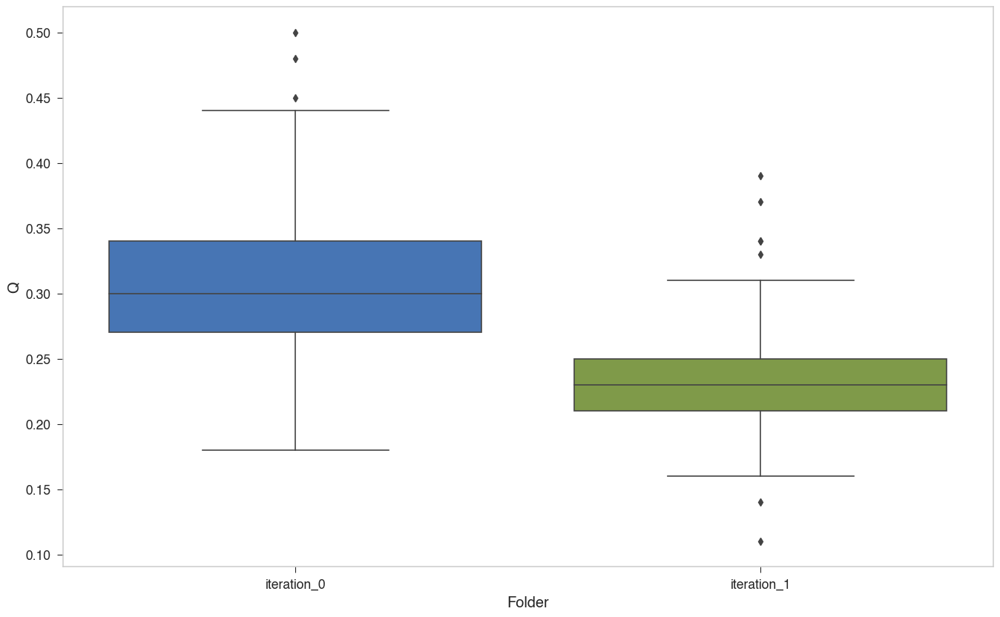

In [10]:
sns.boxplot("Folder", "Q", data=sub_data)

In [4]:
simulationType = "mass_iterative_run"
run_n = 1
folder_list = ["iteration_0", "iteration_1", "iteration_2", "iteration_3"]
all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/feb_2020/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_3_02-17.csv


In [357]:
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_0_02-07.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_1_02-10.csv", index_col=0)
# data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_2_02-11.csv", index_col=0)
data = pd.read_csv("/Users/weilu/Research/data/openMM/mass_iterative_run_iteration_3_02-17.csv", index_col=0)

# sub_pdb_list = pdb_list
# data.Protein = pd.Categorical(data.Protein, 
#                       categories=sub_pdb_list)

In [358]:
y = "Steps"
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data

In [359]:
def distplot_fig(data, x, hue=None, row=None, col=None, legend=True, hist=False, **kwargs):
    """A figure-level distribution plot with support for hue, col, row arguments."""
    bins = kwargs.pop('bins', None)
    if (bins is None) and hist: 
        # Make sure that the groups have equal-sized bins
        bins = np.histogram_bin_edges(data[x].dropna())
    g = sns.FacetGrid(data, hue=hue, row=row, col=col)
    g.map(sns.distplot, x, bins=bins, hist=hist, **kwargs)
    if legend and (hue is not None) and (hue not in [x, row, col]):
        g.add_legend(title=hue) 
    return g   

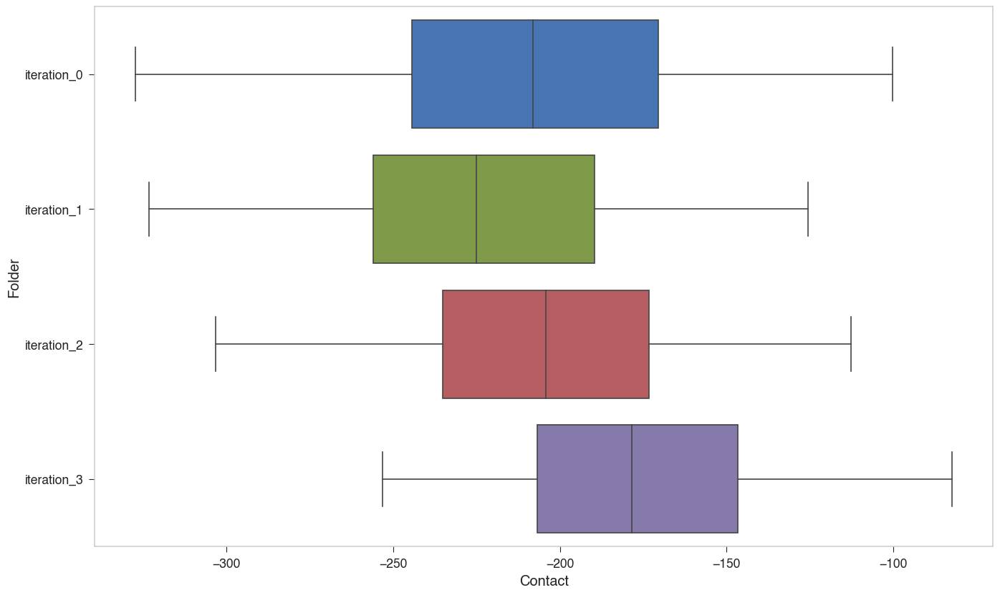

In [363]:
sns.boxplot("Contact", "Folder", data=sub_data)

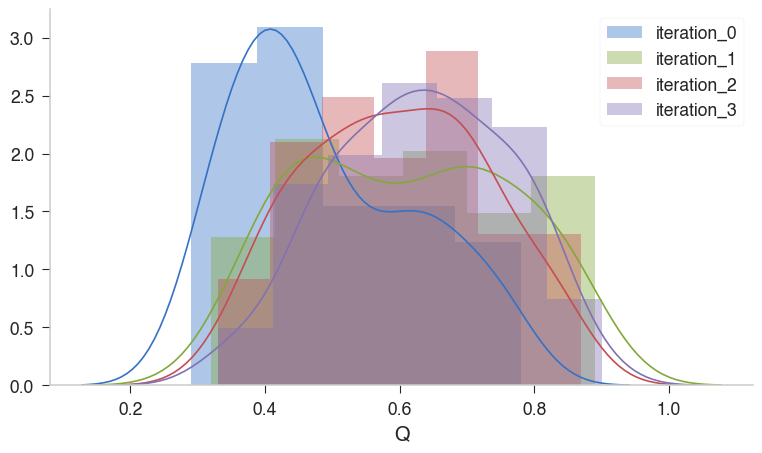

In [19]:
g = sns.FacetGrid(sub_data, hue="Folder", height=5, aspect=1.618)
g = g.map(sns.distplot, "Q")
plt.legend()

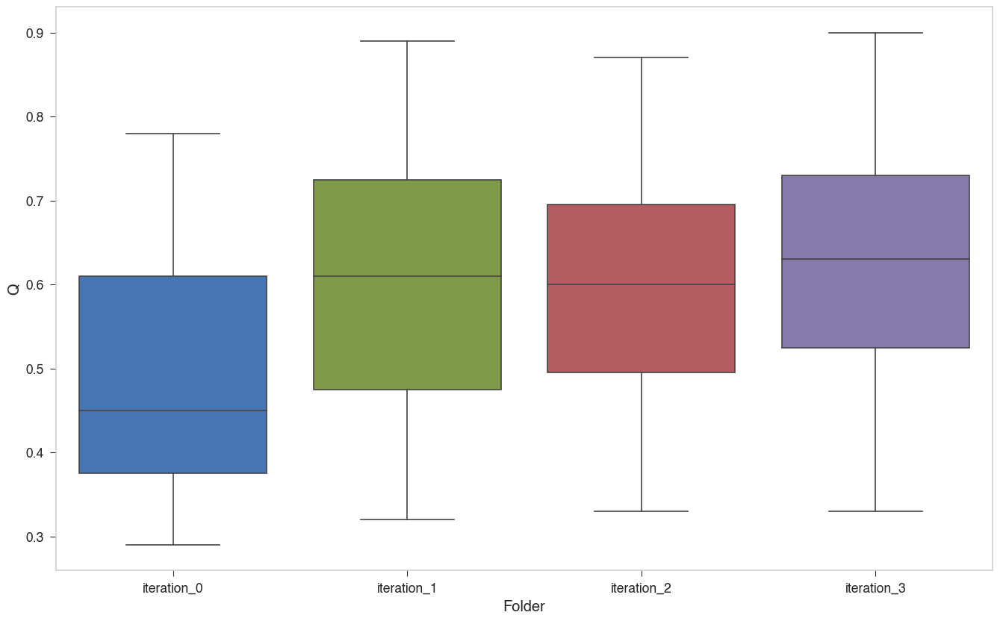

In [20]:
sns.boxplot("Folder", "Q", data=sub_data)

In [26]:
print(new_order)

['1PUC', '1HTP', '2ACY', '2MCM', '1ALY', '1C52', '2PII', '1BB9', '1KUH', '2TGI', '1BQK', '1CYO', '1RLW', '1AX8', '1FMB', '1BY9', '1FNA', '1KPF', '1POC', '1OPD', '1WHO', '1CC5', '1SKZ', '1RSS', '2SNS', '3CYR', '1B6E', '1MSC', '1AKR', '1OSA', '1BY2', '2END', '1BKF', '2CBP', '1BGF', '1CTJ', '1AQE', '3LZT', '1HMT', '1DIV', '1A6F', '1GVP', '1PLC', '1SFP', '1CXC', '1MAI', '2A0B', '1YCC', '1RMD', '1BTN', '1LBA', '1CRB', '1CPQ', '1PTF', '1DUN', '1VCC', '1MBA', '1WHI', '1KTE', '1OPC', '1LCL', '1PKP', '1A32', '451C', '1TIF', '3PYP', '1BEA', '1A1X', '2HBG', '1POA', '1RIE', '7RSA', '1HYP', '1FLP', '1RCB', '1BM8', '1OPY', '1AQT', '1DHN', '1TFE', '5NUL', '1PNE', '1VLS', '1JON', '1RZL', '1BFG', '2SAK', '1PDO', '1PHT', '1HOE', '1BAJ', '3VUB', '3CHY', '1ERV', '1TMY', '1NEU', '1TIG', '1BDO', '1TUL']


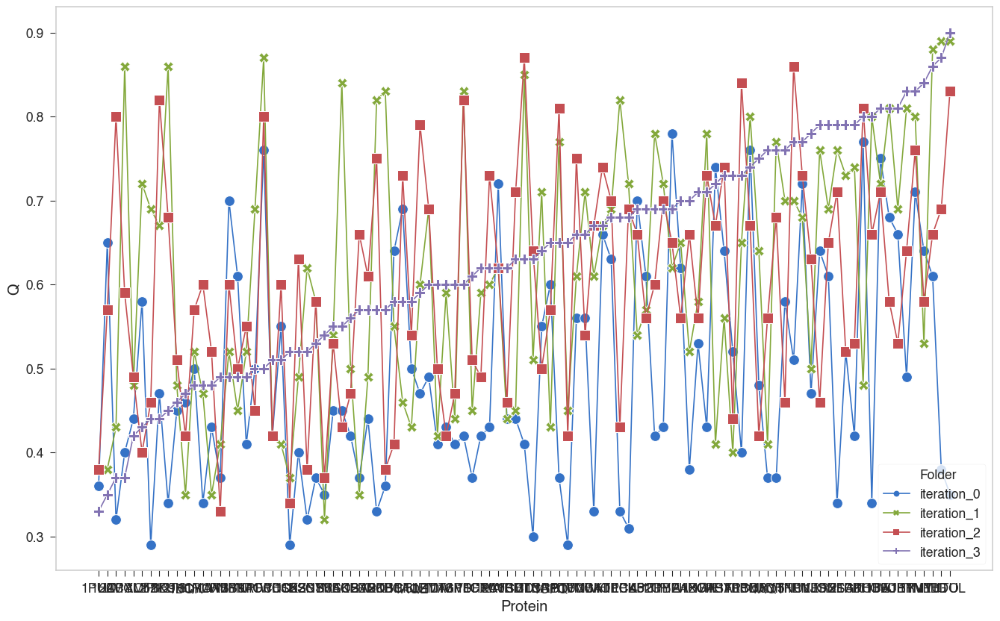

In [24]:
new_order = max_Q_data.query("Folder == 'iteration_3'").sort_values("Q")["Protein"].unique().to_list()
sub_data = max_Q_data.sort_values("Q").reset_index(drop=True).reset_index()
sub_data.Protein = sub_data.Protein.astype(str)
sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=new_order)
ax = sns.lineplot(x="Protein", y="Q", markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False, sort=True)

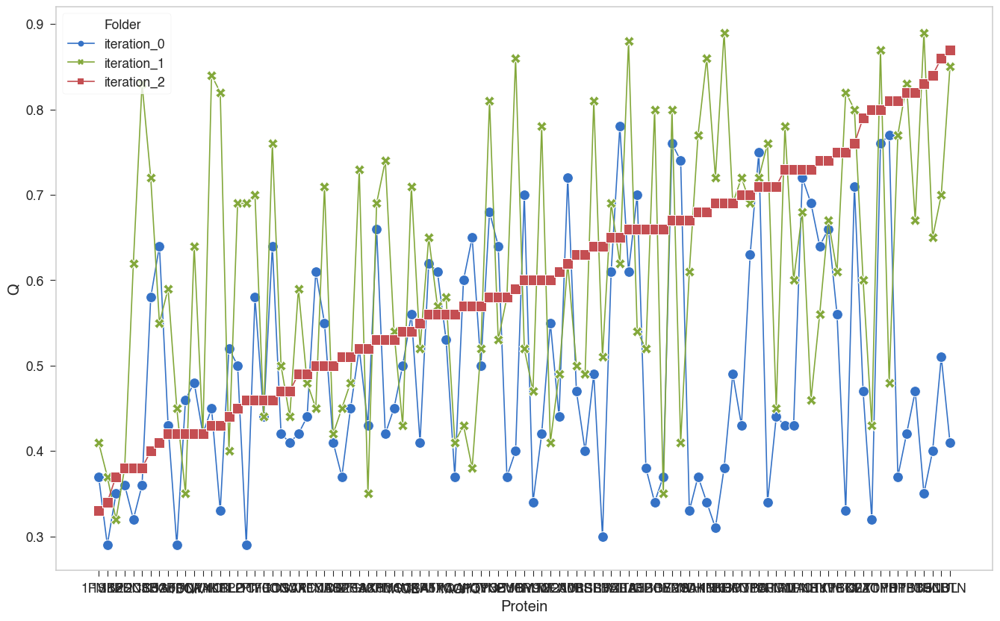

In [73]:
new_order = max_Q_data.query("Folder == 'iteration_2'").sort_values("Q")["Protein"].unique().to_list()
sub_data = max_Q_data.sort_values("Q").reset_index(drop=True).reset_index()
sub_data.Protein = sub_data.Protein.astype(str)
sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=new_order)
ax = sns.lineplot(x="Protein", y="Q", markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False, sort=True)

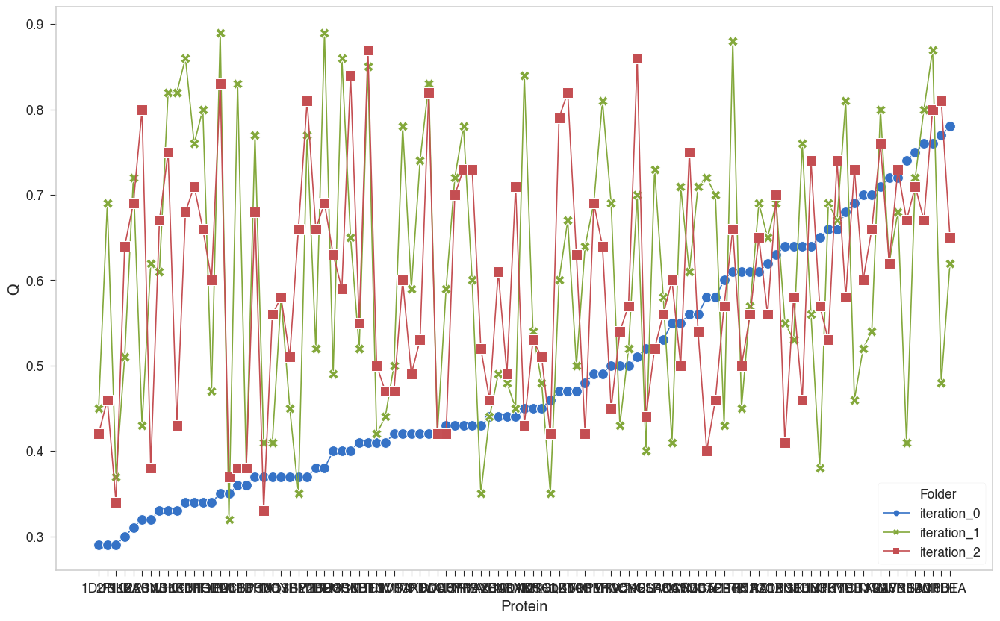

In [71]:
new_order = max_Q_data.query("Folder == 'iteration_0'").sort_values("Q")["Protein"].unique().to_list()
sub_data = max_Q_data.sort_values("Q").reset_index(drop=True).reset_index()
sub_data.Protein = sub_data.Protein.astype(str)
sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=new_order)
ax = sns.lineplot(x="Protein", y="Q", markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False, sort=True)

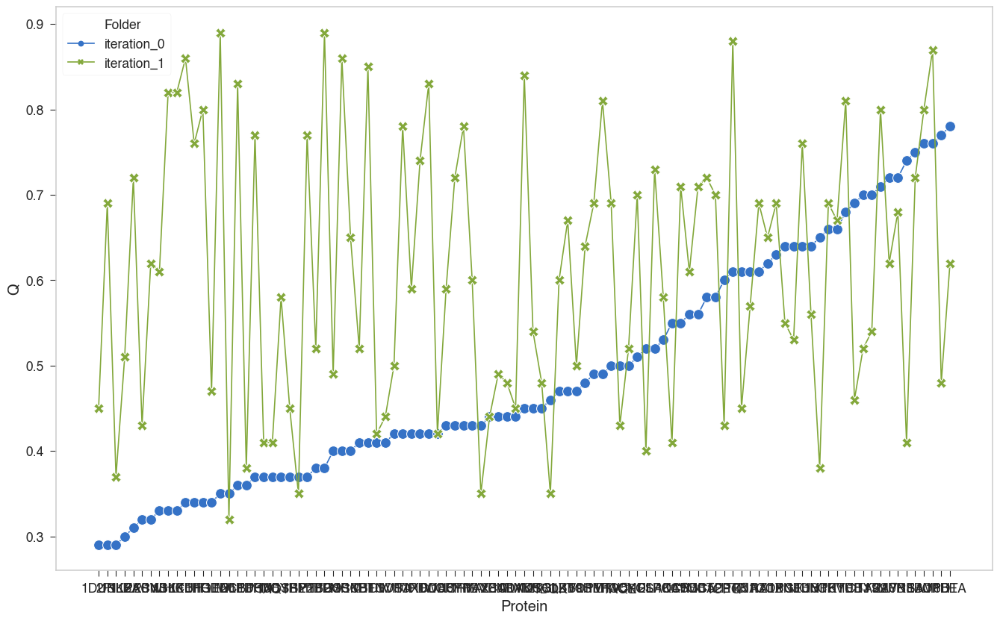

In [67]:
new_order = max_Q_data.query("Folder == 'iteration_0'").sort_values("Q")["Protein"].unique().to_list()
sub_data = max_Q_data.sort_values("Q").reset_index(drop=True).reset_index()
sub_data.Protein = sub_data.Protein.astype(str)
sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=new_order)
ax = sns.lineplot(x="Protein", y="Q", markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False, sort=True)

In [47]:
y = "Q"
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data

In [50]:
new_order = max_Q_data.query("Folder == 'iteration_0'").sort_values("Q")["Protein"].unique().to_list()

In [59]:
sub_data = max_Q_data.sort_values("Q").reset_index(drop=True).reset_index()
sub_data.Protein = sub_data.Protein.astype(str)
sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=new_order)

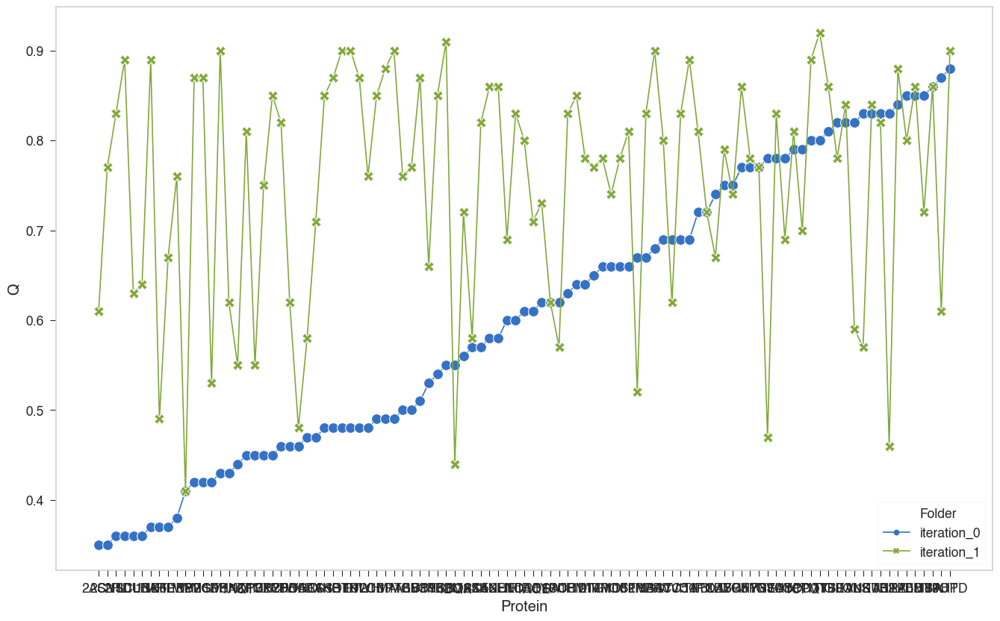

In [61]:
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False, sort=True)

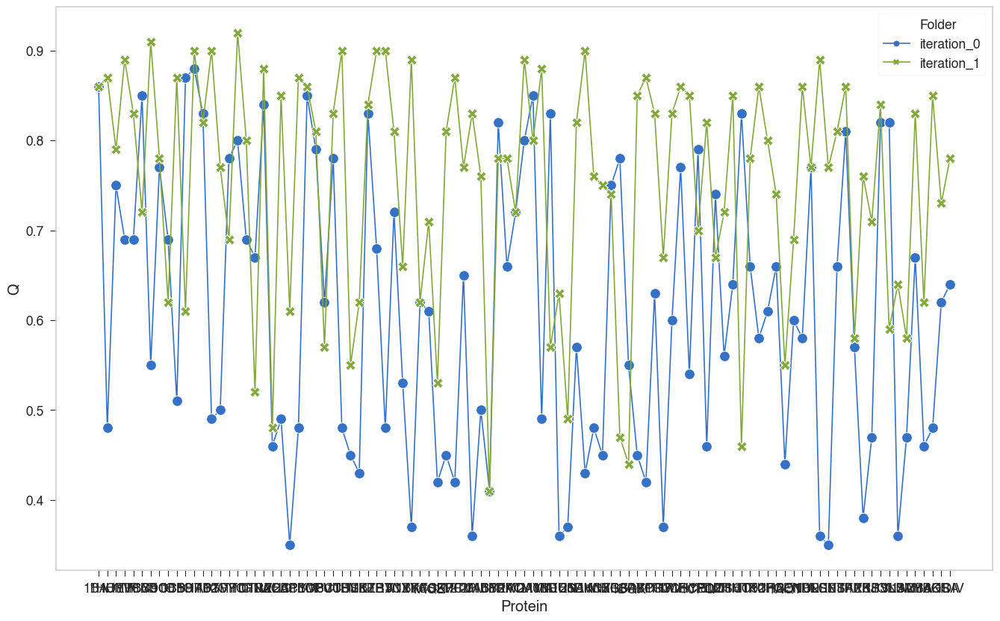

In [22]:

# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


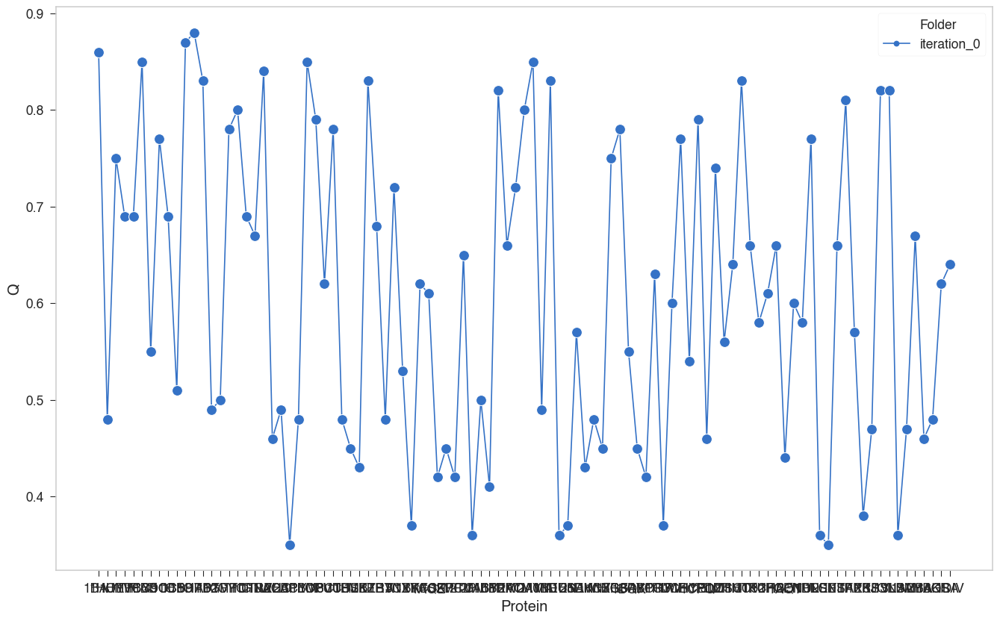

In [10]:

# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [165]:
pdb_list = dataset["optimization_cath"]
simulationType = "optimization_database"
run_n = 5
folder_list = ["iter0_gpu"]
all_data = []

for folder in folder_list:
    for pdb in pdb_list:
        for i in range(run_n):
                pre = f"/Users/weilu/Research/server/dec_2019/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)


/Users/weilu/Research/data/openMM/optimization_database_iter0_gpu_12-29.csv


In [167]:
data = pd.read_csv("/Users/weilu/Research/data/openMM/optimization_database_iter0_gpu_12-29.csv", index_col=0)
sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)

In [170]:
max_Q_data

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Membrane,ER,TBM_Q,Beta,Pap,Helical,Total,Run,Protein,Folder
0,366,0.56,11.60,408.51,-574.28,-220.53,-202.01,0.0,0.0,0.0,-24.93,-0.00,0.0,-613.24,0,1a75A00,iter0_gpu
1,478,0.30,15.25,533.60,-758.93,-330.51,-274.89,0.0,0.0,0.0,-27.71,-1.52,0.0,-859.96,0,1bekA01,iter0_gpu
2,271,0.39,14.98,584.51,-793.09,-181.79,-237.88,0.0,0.0,0.0,-30.24,-0.02,0.0,-658.51,4,1bqbA02,iter0_gpu
3,497,0.41,15.49,556.91,-1226.64,-328.39,-345.68,0.0,0.0,0.0,-59.33,-0.00,0.0,-1403.12,2,1cpcB00,iter0_gpu
4,447,0.46,13.25,369.69,-675.83,-179.42,-183.97,0.0,0.0,0.0,-24.79,-0.00,0.0,-694.33,2,1cscA02,iter0_gpu
5,336,0.69,11.34,361.05,-668.22,-163.57,-194.35,0.0,0.0,0.0,-25.60,-0.00,0.0,-690.68,4,1cy5A00,iter0_gpu
6,478,0.59,10.54,231.20,-352.70,-150.07,-142.83,0.0,0.0,0.0,-19.35,-0.00,0.0,-433.75,0,1dv5A00,iter0_gpu
7,181,0.36,17.51,892.96,-1120.93,-340.00,-323.41,0.0,0.0,0.0,-44.09,-1.14,0.0,-936.62,2,1e8yA05,iter0_gpu
8,407,0.40,13.83,512.47,-855.85,-307.81,-259.17,0.0,0.0,0.0,-40.74,-0.21,0.0,-951.30,4,1evyA02,iter0_gpu
9,484,0.82,10.89,221.51,-556.43,-119.58,-171.95,0.0,0.0,0.0,-28.40,-0.01,0.0,-654.85,3,1in4A03,iter0_gpu


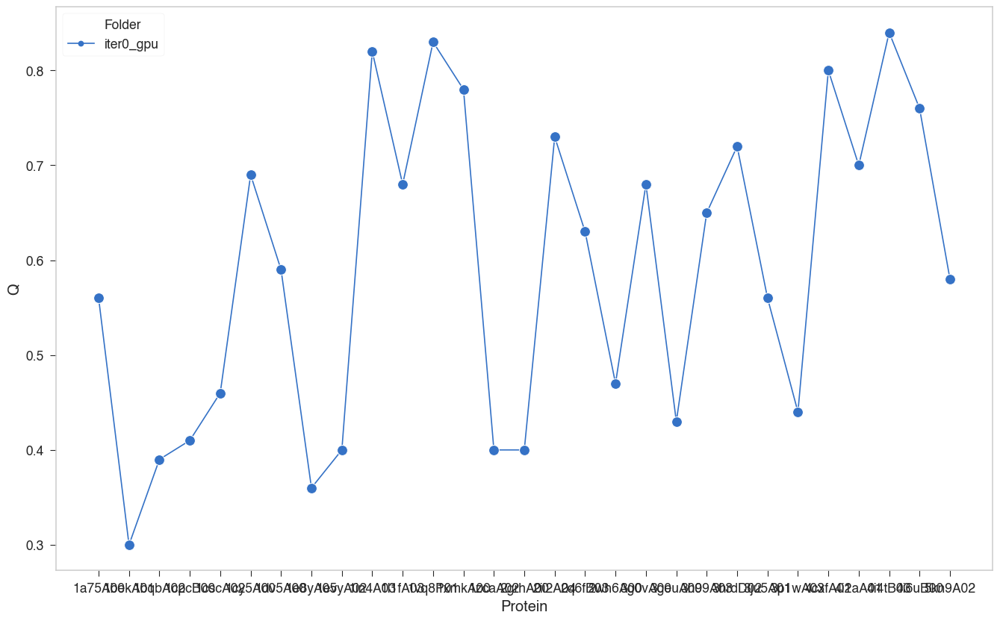

In [169]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [153]:
d = pd.read_csv("/Users/weilu/Research/server/dec_2019/iterative_optimization/original_pdbs/first_test_set.csv", index_col=0)
d = d.sort_values("Lpdb").reset_index(drop=True)
pdb_list = d.PDB.str.lower().to_list()

In [192]:
pdb_list = dataset["optimization"]
simulationType = "iterative_optimization"
# folder = "original"
# folder = "first"
# folder = "second_withoutExclusion"
# folder_list = ["first", "second_withoutExclusion"]
# "first", 
folder_list = ["iter7_gpu_long", "iter7_gpu", "iter6_gpu", "iter5_gpu", "iter5_withBiased_gpu", "iter0_gpu_less_beta", "iter4_gpu", "first_cpu2", "first_iter1_cpu4", "first_gpu", "iter2_gpu", "iter2_real_gpu", "iter3_gpu"]
all_data = []
for folder in folder_list:
    for pdb in pdb_list:
        for i in range(10):
                pre = f"/Users/weilu/Research/server/dec_2019/{simulationType}/{folder}/{pdb}/{i}"
                info_file = "info.dat"
                location = f"{pre}/{info_file}"
                try:
                    tmp = pd.read_csv(location, sep="\s+")
                    tmp = tmp.assign(Run=i, Protein=pdb, Folder=folder)
                    all_data.append(tmp)
                except:
                    print(pdb, i, folder)
                    pass
data = pd.concat(all_data)
today = datetime.today().strftime('%m-%d')
outFile = f"/Users/weilu/Research/data/openMM/{simulationType}_{folder}_{today}.csv"
data.reset_index(drop=True).to_csv(outFile)
print(outFile)

/Users/weilu/Research/data/openMM/iterative_optimization_iter3_gpu_01-03.csv


In [4]:
data = pd.read_csv("/Users/weilu/Research/data/openMM/iterative_optimization_iter3_gpu_01-03.csv", index_col=0)

/Users/weilu/anaconda3/envs/py36/lib/python3.6/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [194]:
sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)

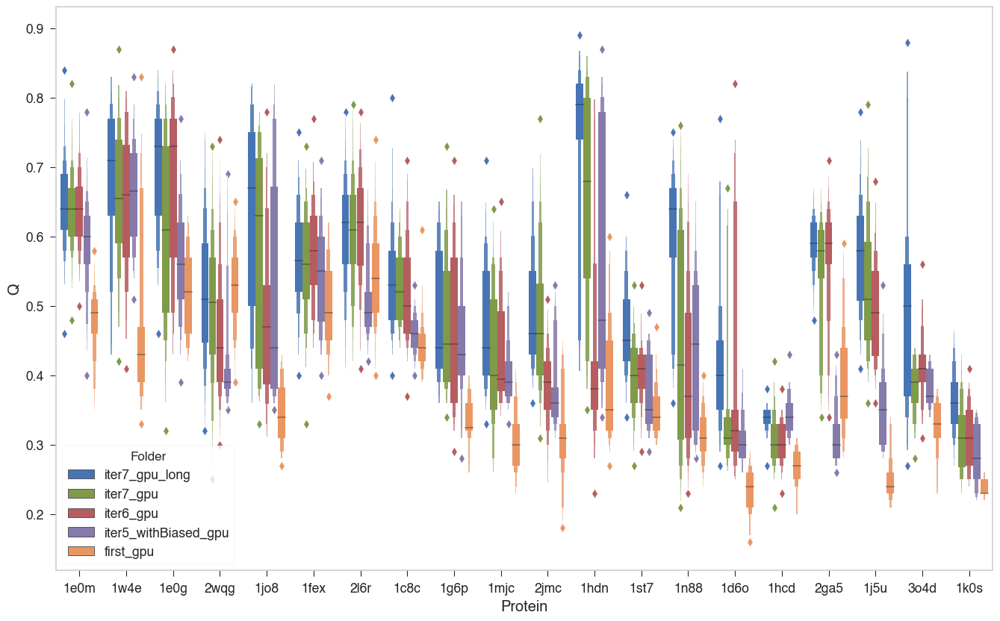

In [196]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
d = data.query("Folder == 'iter7_gpu_long' or Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu' or Folder == 'iter6_gpu' or Folder == 'iter7_gpu'").reset_index(drop=True)
#
t = d.groupby(["Protein", "Run", "Folder"]).tail(20)
ax = sns.boxenplot(x="Protein", y=y, hue="Folder", data=t)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


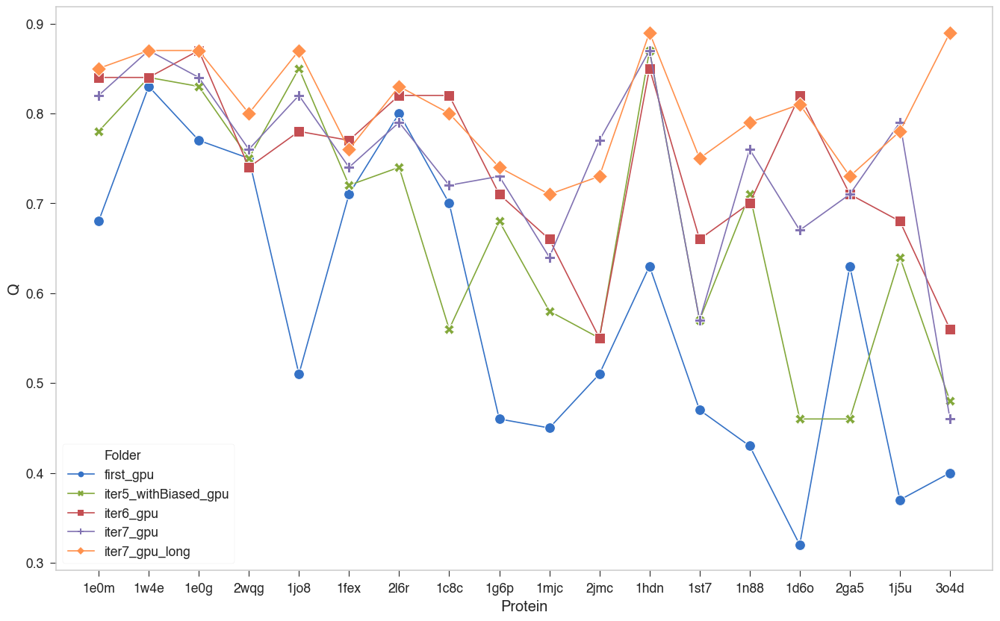

In [5]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data.query("Folder == 'iter7_gpu_long' or Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu' or Folder == 'iter6_gpu' or Folder == 'iter7_gpu'").reset_index(drop=True)
# d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
sub_data = max_Q_data.query("Protein != '1hcd'").reset_index(drop=True)
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
dataset["optimization_v2"] = ['1e0m', '1w4e', '1e0g', '2wqg', '1jo8', '1fex', '2l6r', '1c8c', '1g6p', '1mjc', '2jmc', '1hdn', '1st7', '1n88', '1d6o', '2ga5', '1j5u', '3o4d']

sub_data.Protein = pd.Categorical(sub_data.Protein, 
                      categories=dataset["optimization_v2"])
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [ ]:
sub_data

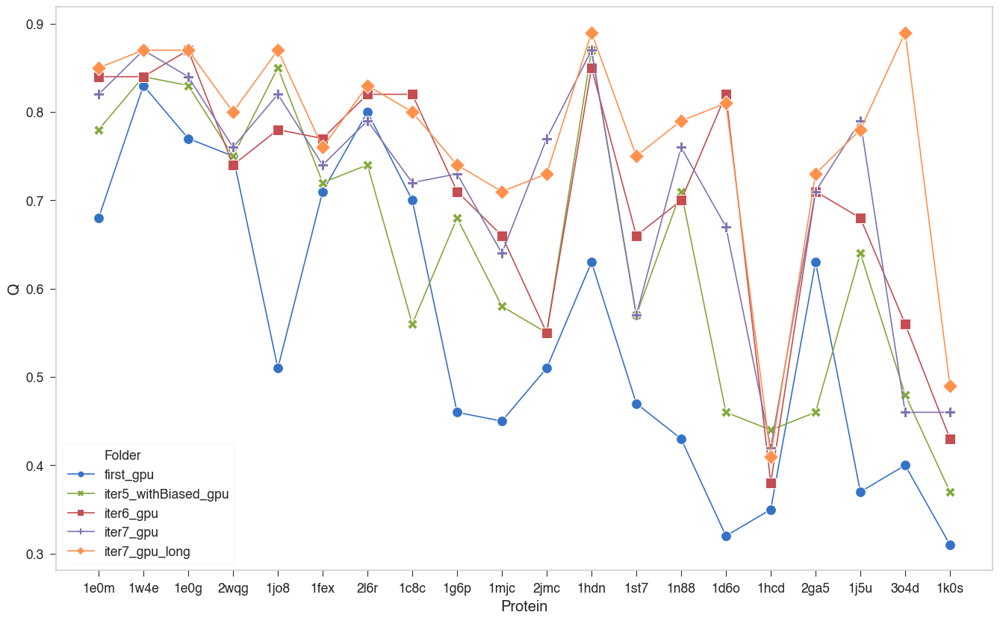

In [195]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data.query("Folder == 'iter7_gpu_long' or Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu' or Folder == 'iter6_gpu' or Folder == 'iter7_gpu'").reset_index(drop=True)
# d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


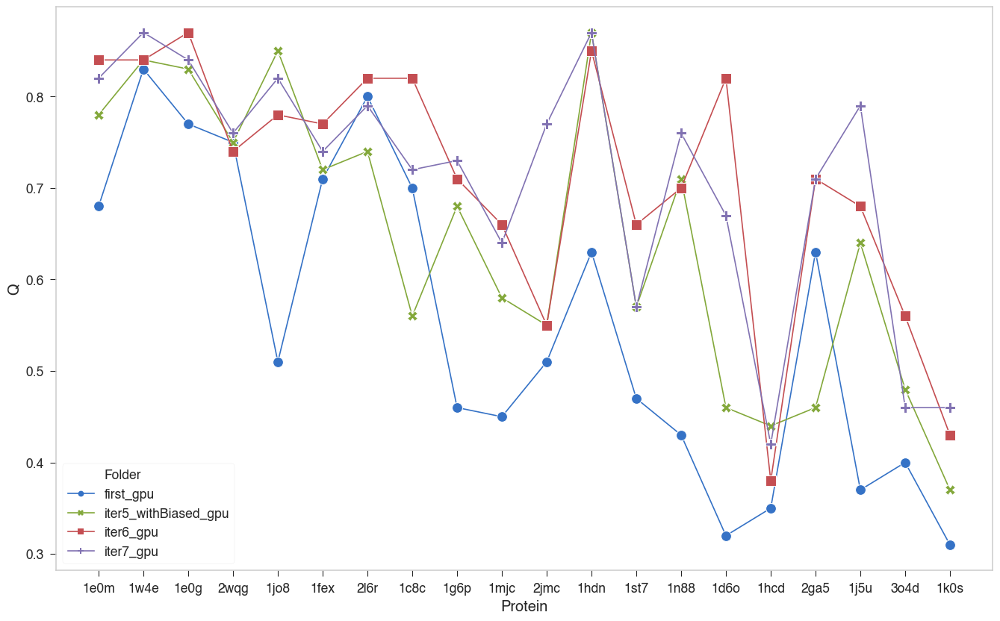

In [191]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data.query("Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu' or Folder == 'iter6_gpu' or Folder == 'iter7_gpu'").reset_index(drop=True)
# d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


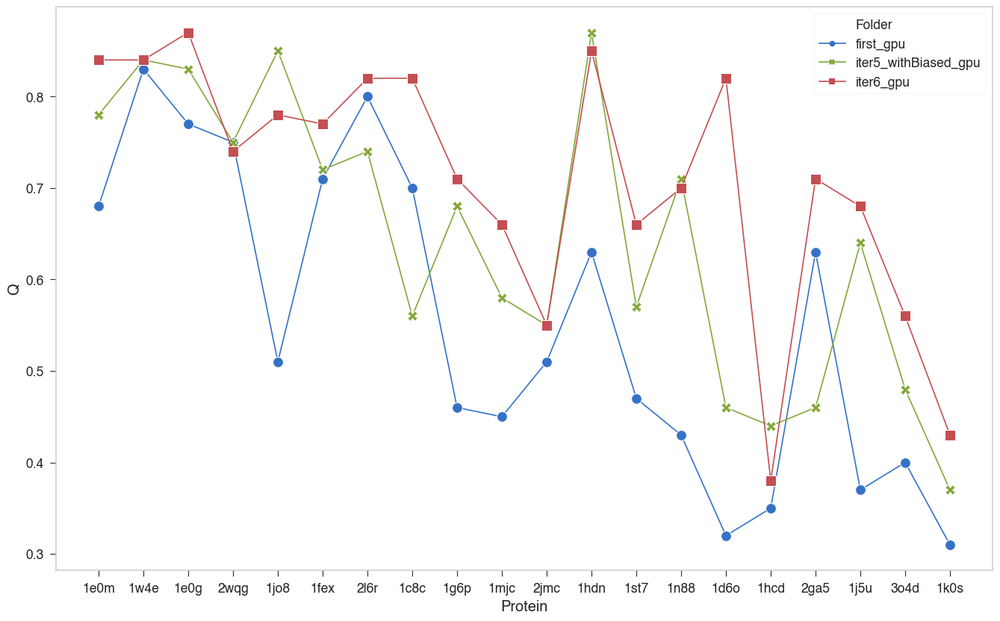

In [185]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data.query("Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu' or Folder == 'iter6_gpu'").reset_index(drop=True)
# d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


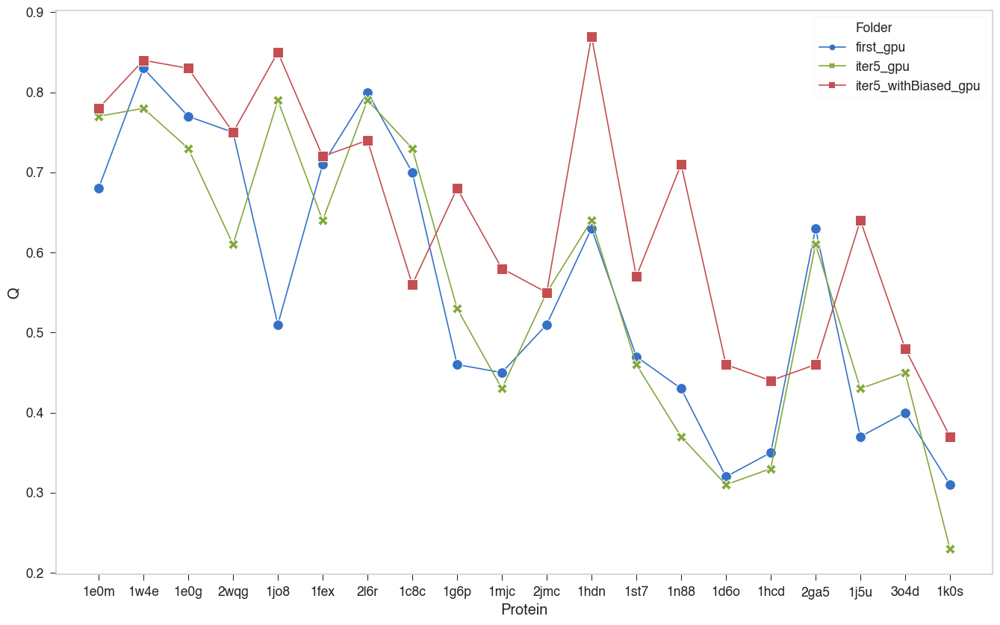

In [184]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
d = data.query("Folder=='iter5_gpu' or Folder == 'iter5_withBiased_gpu' or Folder == 'first_gpu'").reset_index(drop=True)
# d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


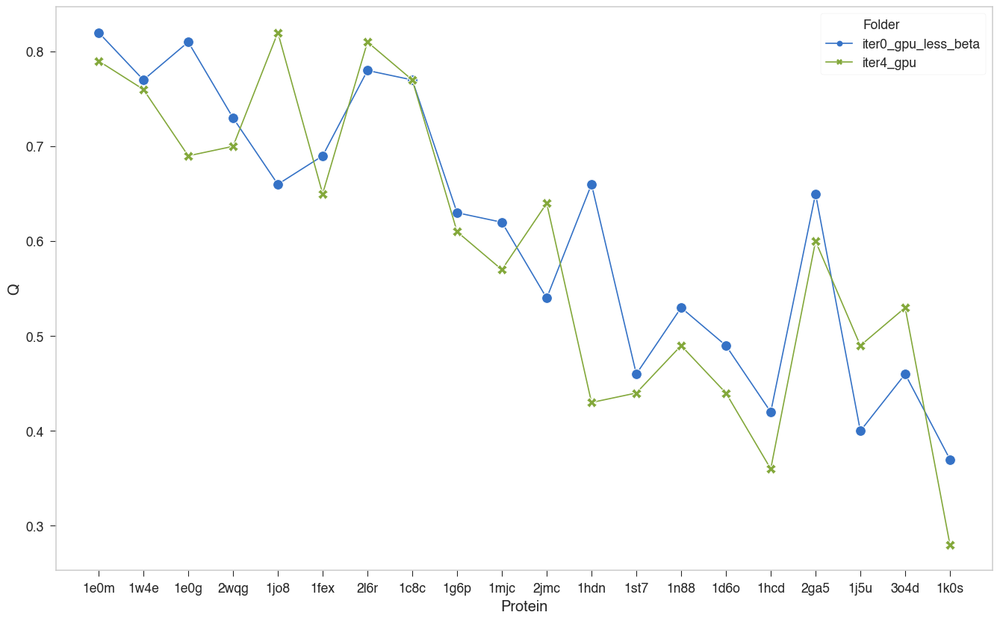

In [160]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
# d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


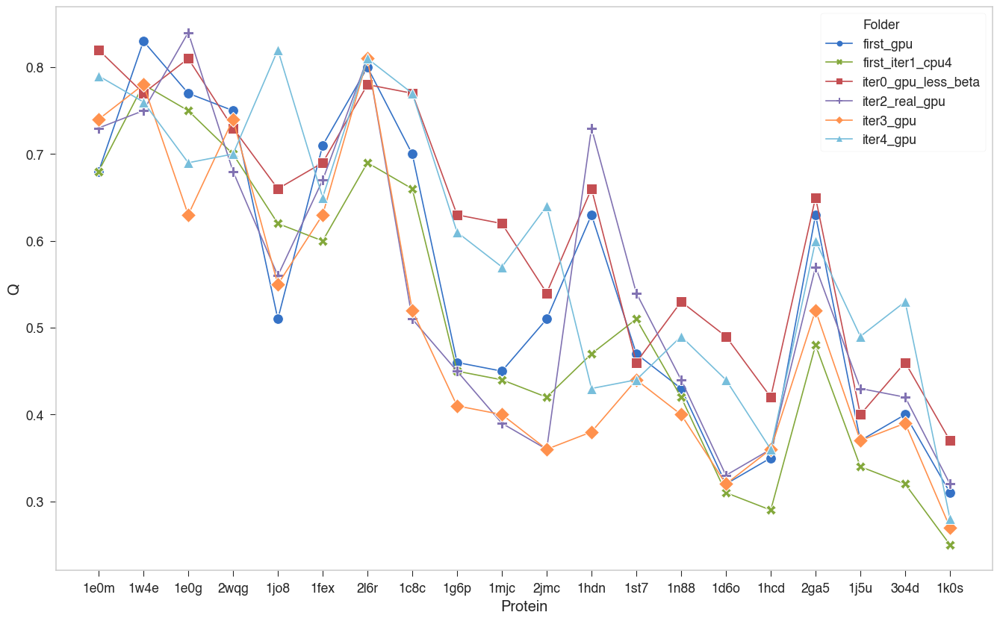

In [161]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
# d = data.query("Folder=='iter0_gpu_less_beta' or Folder == 'iter4_gpu'").reset_index(drop=True)
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


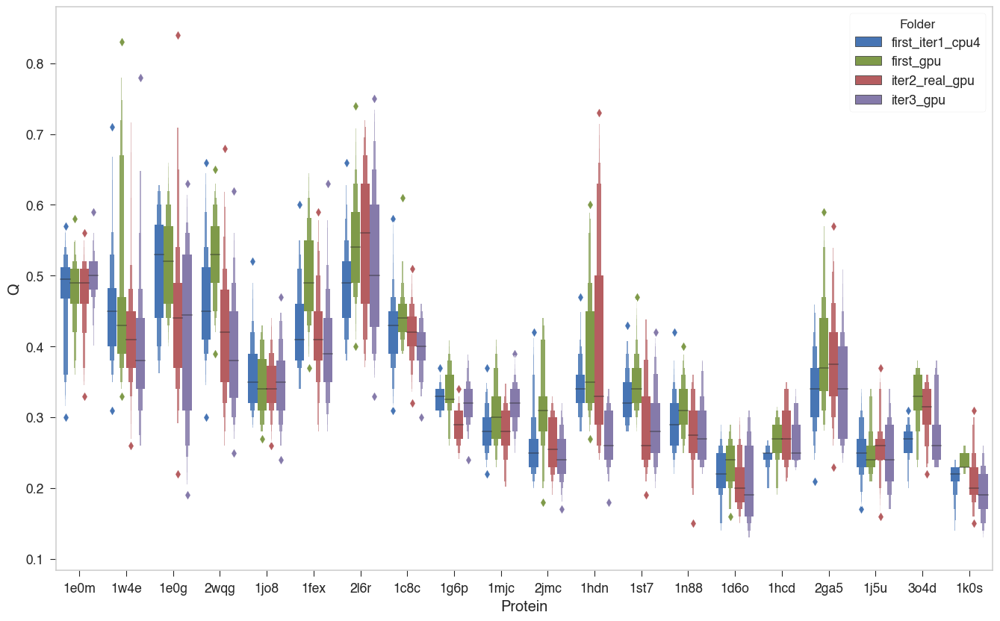

In [149]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
t = d.groupby(["Protein", "Run", "Folder"]).tail(20)
ax = sns.boxenplot(x="Protein", y=y, hue="Folder", data=t)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


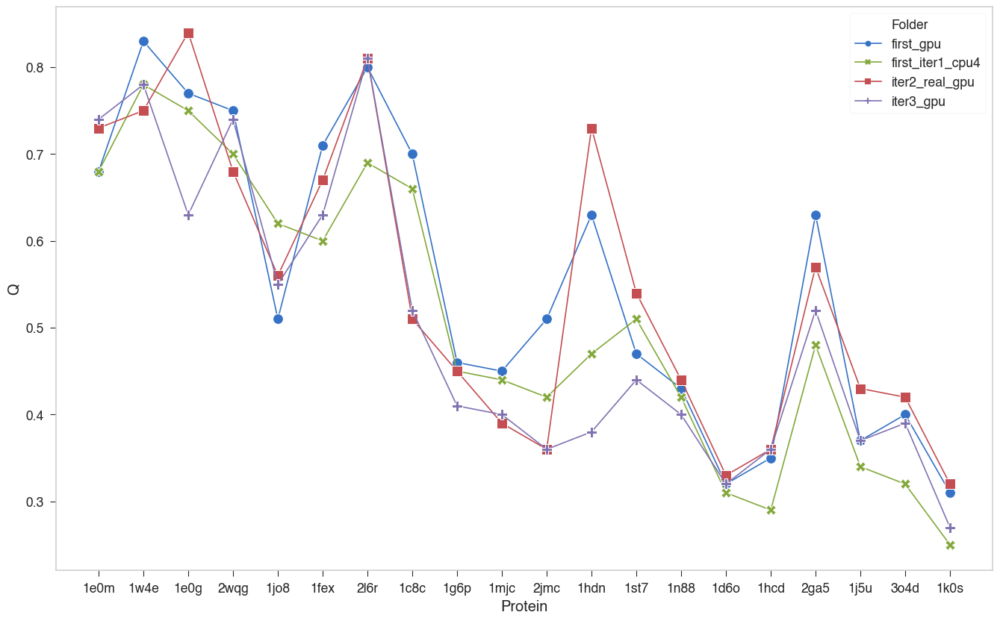

In [144]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data.query("Folder!='iter2_gpu' and Folder != 'first_cpu2'").reset_index(drop=True)
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


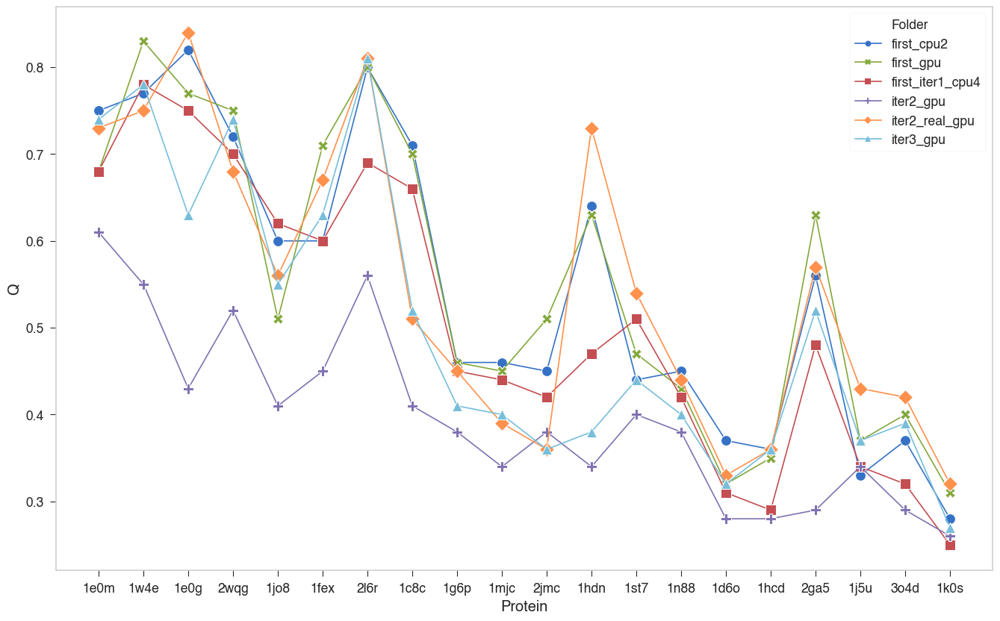

In [140]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data.query("Folder != 'iter2_gpu'")
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


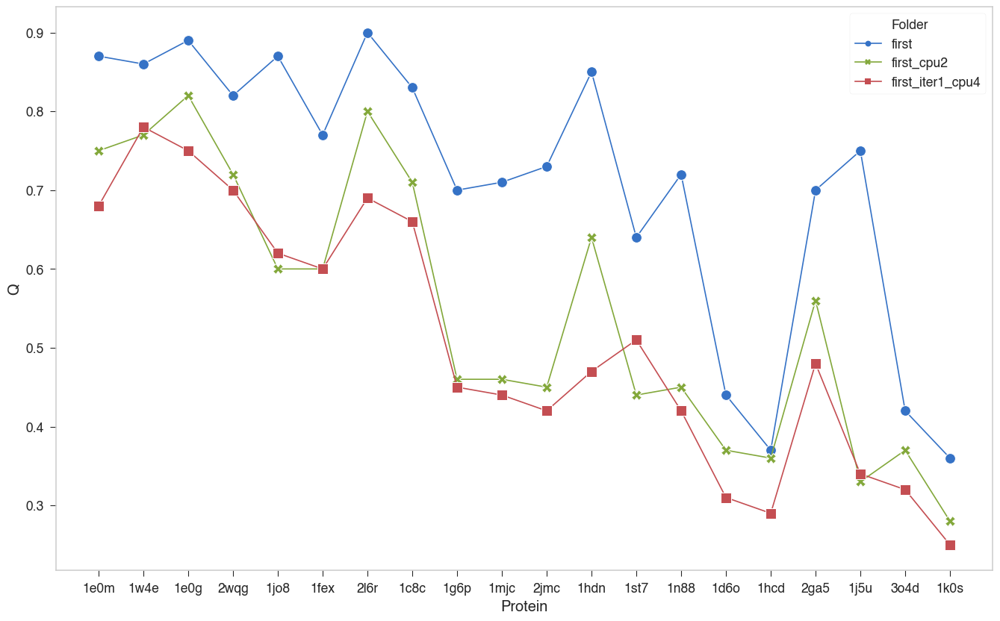

In [121]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [ ]:
y = "Steps"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


# CPU, thread 1

In [ ]:
data = pd.read_csv("/Users/weilu/Research/data/openMM/iterative_optimization_first_12-14.csv", index_col=0)
sub_pdb_list = pdb_list
data.Protein = pd.Categorical(data.Protein, 
                      categories=sub_pdb_list)

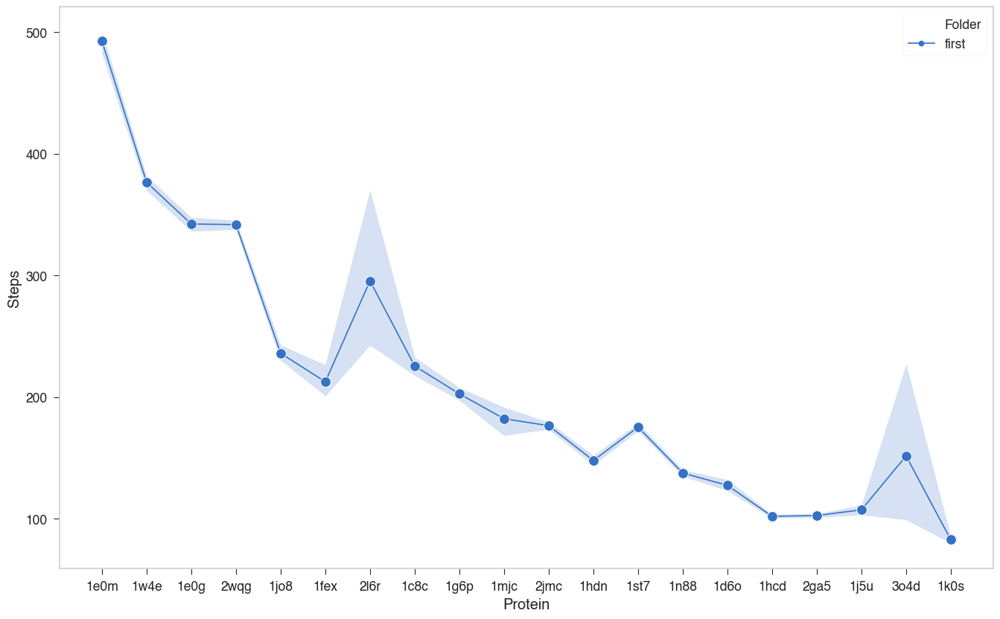

In [24]:
y = "Steps"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


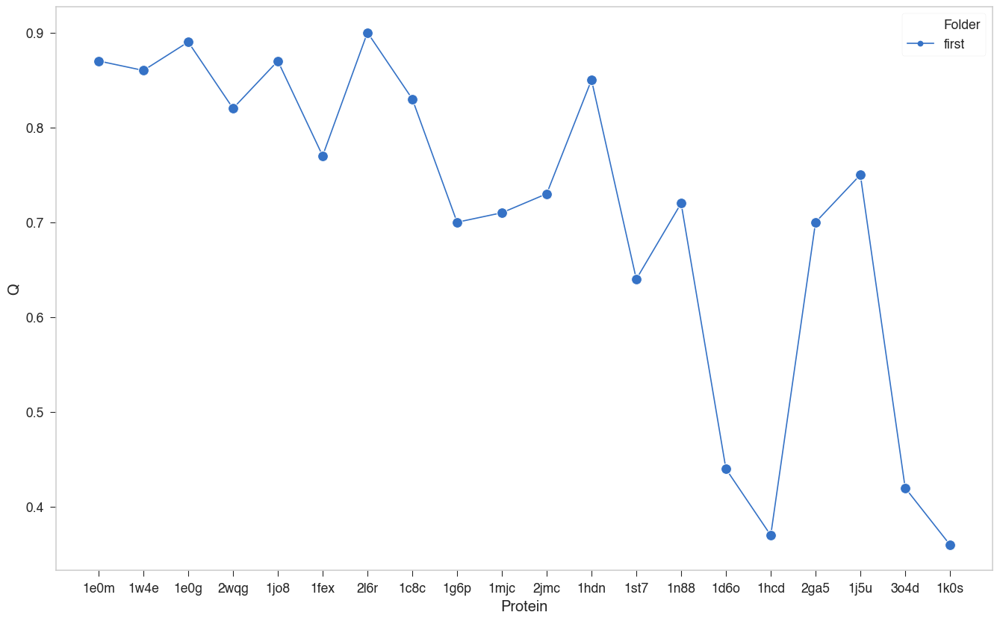

In [21]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


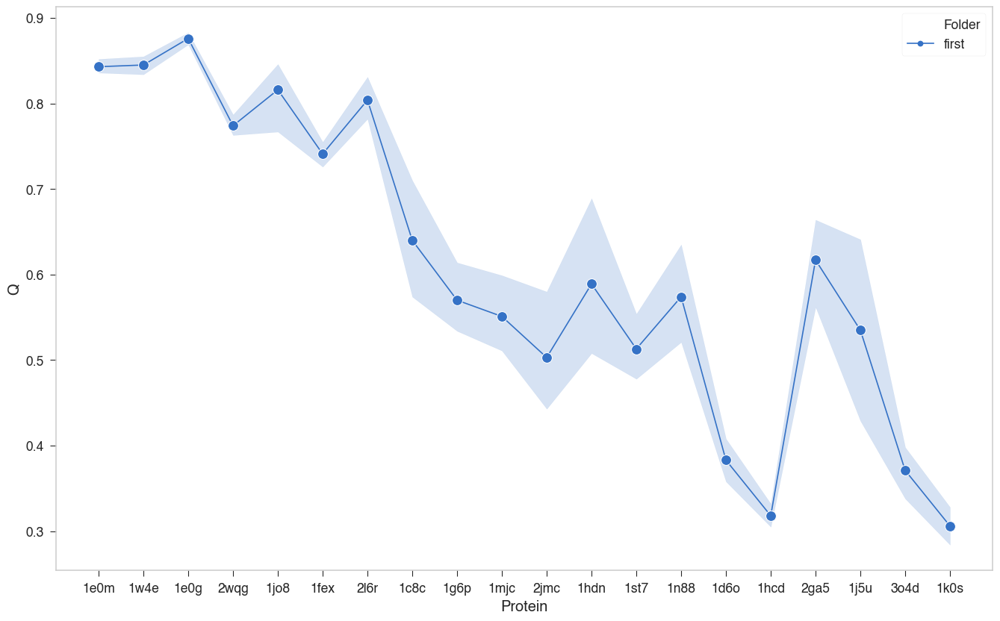

In [27]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder", "Run"])[y].idxmax().reset_index()
max_Q_data = d.iloc[t[y].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


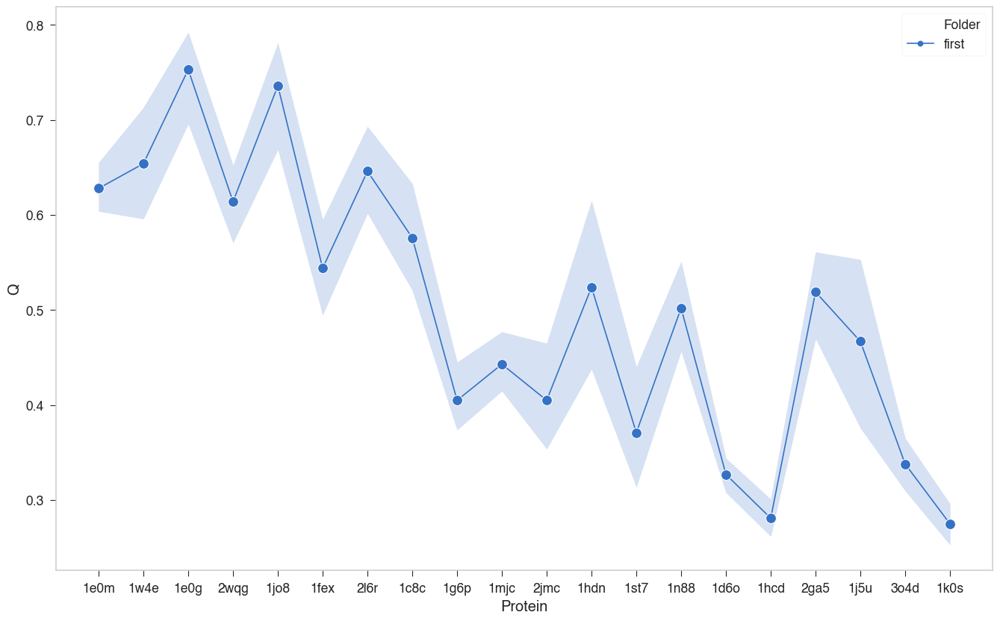

In [28]:
y = "Q"
# d = data.query("Steps > 1500").reset_index(drop=True)
d = data
t = d.groupby(["Protein", "Folder", "Run"])["Steps"].idxmax().reset_index()
max_Q_data = d.iloc[t["Steps"].to_list()].reset_index(drop=True)
sub_data = max_Q_data
# sub_data = max_Q_data.query("Scheme in ['hybrid contact', 'contact as in water', 'contact as in membrane']")
# sub_data = max_Q_mem_data
ax = sns.lineplot(x="Protein", y=y, markers=True, ms=10, style="Folder", hue="Folder", data=sub_data, dashes=False)
# _ = ax.set_xticklabels(labels=sub_label_list, rotation=0, ha='center')


In [16]:
data

,Steps,Q,Rg,Backbone,Rama,Contact,Fragment,Membrane,ER,TBM_Q,Beta,Pap,Helical,Total,Run,Protein,Folder
0,0,0.05,36.04,68.02,-111.94,-21.21,-13.23,0.0,0.0,0.0,-0.00,0.00,0.0,-78.36,0,1e0m,first
1,1,0.10,33.51,1.35,-118.56,-33.90,-21.35,0.0,0.0,0.0,-0.00,0.00,0.0,-172.46,0,1e0m,first
2,2,0.20,22.52,193.61,-61.70,-28.71,-37.44,0.0,0.0,0.0,-0.00,0.00,0.0,65.76,0,1e0m,first
3,3,0.15,20.12,214.98,-83.38,-29.58,-30.61,0.0,0.0,0.0,-0.00,0.00,0.0,71.41,0,1e0m,first
4,4,0.26,17.40,202.66,-80.84,-29.53,-42.52,0.0,0.0,0.0,-9.62,0.00,0.0,40.15,0,1e0m,first
5,5,0.32,17.36,237.12,-81.77,-30.40,-43.85,0.0,0.0,0.0,-4.70,-0.01,0.0,76.38,0,1e0m,first
6,6,0.35,13.83,193.53,-75.48,-29.74,-48.77,0.0,0.0,0.0,-11.08,-3.34,0.0,25.11,0,1e0m,first
7,7,0.31,11.38,209.04,-75.46,-30.34,-39.83,0.0,0.0,0.0,-11.80,-2.85,0.0,48.77,0,1e0m,first
8,8,0.28,14.80,201.89,-66.88,-31.54,-42.82,0.0,0.0,0.0,-20.81,-8.83,0.0,31.01,0,1e0m,first
9,9,0.30,18.44,213.88,-63.19,-30.29,-48.24,0.0,0.0,0.0,-7.52,-0.00,0.0,64.64,0,1e0m,first


In [30]:
parser = PDBParser()

In [35]:
movie_dcd = "/Users/weilu/Research/server/dec_2019/iterative_optimization/first/2wqg/4/movie.dcd"

In [36]:
s = parser.get_structure("X", movie_dcd)

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 20: invalid start byte

In [31]:
movie = "/Users/weilu/Research/server/dec_2019/iterative_optimization/first/2wqg/4/movie.pdb"

In [37]:
movie = "/Users/weilu/Research/server/dec_2019/iterative_optimization/first/2wqg/0/movie.pdb"

In [38]:
s = parser.get_structure("X", movie)

In [45]:

complete_models = []
for i in range(10):
    movie = f"/Users/weilu/Research/server/dec_2019/iterative_optimization/first/2wqg/{i}/movie.pdb"
    s = parser.get_structure("X", movie)
    complete_models += list(s.get_models())

In [65]:
t = data.query("Protein == '2wqg' and Steps > 1").reset_index(drop=True)
t = t.rename(columns={"Q":"Qw"})

In [49]:
len(complete_models)

3409

In [73]:
print(pdb_list)

['1e0m', '1w4e', '1e0g', '2wqg', '1jo8', '1fex', '2l6r', '1c8c', '1g6p', '1mjc', '2jmc', '1hdn', '1st7', '1n88', '1d6o', '1hcd', '2ga5', '1j5u', '3o4d', '1k0s']


In [ ]:
folder_list = ["first"]
folder = "first"
pre = f"/scratch/wl45/dec_2019/iterative_optimization/{folder}"
to_folder = "."
os.system(f"mkdir -p {to_folder}/decoys/openMM")
complete_models = []
for pdb in pdb_list:
    for i in range(10):
        movie = f"{pre}/{pdb}/{i}/movie.pdb"
        s = parser.get_structure("X", movie)
        complete_models += list(s.get_models())
    t = data.query(f"Protein == '{pdb}' and Steps > 1").reset_index(drop=True)
    t["structure"] = complete_models
    t = t.rename(columns={"Q":"Qw"})
    last50 = t.groupby("Run").tail(50).reset_index(drop=True)
    to_folder = "."
    last50.to_pickle(f"{to_folder}/decoys/openMM/{folder}_{pdb}")

In [75]:
folder_list = ["first"]
folder = "first"
pdb = "1w4e"
pre = f"/Users/weilu/Research/server/dec_2019/iterative_optimization/{folder}"
complete_models = []
for i in range(10):
    movie = f"{pre}/{pdb}/{i}/movie.pdb"
    s = parser.get_structure("X", movie)
    complete_models += list(s.get_models())
t = data.query(f"Protein == '{pdb}' and Steps > 1").reset_index(drop=True)
t["structure"] = complete_models
t = t.rename(columns={"Q":"Qw"})

In [76]:
len(t)

3756

In [77]:
len(complete_models)

3756

In [112]:
t = pd.read_pickle("/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization/decoys/openMM/1c8c_first.pkl")

In [113]:
structures = t["structure"].to_list()

In [89]:
print(structures[0])

<Model id=172>


In [114]:
all_res = list(structures[0].get_residues())

In [115]:
all_res[0]

<Residue MET het=  resseq=1 icode= >

In [116]:
is_hetero(all_res[0])

False

In [ ]:
all_res

In [96]:
all_res[0].id[0]

'H_NGP'

In [70]:
last50 = t.groupby("Run").tail(50).reset_index(drop=True)

In [ ]:
to_folder = "."
last50.to_pickle(f"{to_folder}/decoys/openMM/{folder}_{pdb}")

In [55]:
t["structure"] = complete_models

In [ ]:
sampled["structure"] = sampled.apply(getStructures, all_movies=all_movies, axis=1)

In [ ]:
import io
from Bio.PDB.PDBParser import PDBParser
simulation_location, name = args.label.split("__")
simulation_location_name = f"{simulation_location}_{name}"

def getStructures(x, all_movies):
    index = int(x["index"])+1
    run = int(x["Run"])

    start = index * size
    end = (index + 1) * size
    f = io.StringIO("".join(all_movies[run][start:end]))
    parser = PDBParser()
    return parser.get_structure(f"{index}", f)

a = pd.read_csv(f"{database_location}/Q_{simulation_location_name}", index_col=0).query(f"Rank < {decoy_n*3}")
sampled = a.sample(decoy_n)
all_movies = {}
for i in sampled["Run"].unique():
    with open(f"{database_location}/{simulation_location_name}_{i}/movie.pdb") as f:
        movie = f.readlines()
    all_movies[i] = movie
size = 0
for line in movie:
    size += 1
    if line == "ENDMDL\n":
        break
print(simulation_location_name, size)
sampled["structure"] = sampled.apply(getStructures, all_movies=all_movies, axis=1)
sampled["Qw"] = sampled[" Qw"].round(3)
sampled.drop(" Qw", axis=1)
sampled.to_pickle(f"decoys/lammps/{name}_{simulation_location}.pkl")

In [ ]:
a